# FLOOD PREDICTION

### Handling datafiles to combine into one csv file

In [102]:
import xarray as xr
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from IPython.display import display
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import uniform, randint
import lightgbm as lgb
from lightgbm import LGBMRegressor
from sklearn.model_selection import KFold
from sklearn.ensemble import VotingRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge
import optuna
from datetime import datetime
from datetime import timedelta
import pickle
import joblib

In [2]:
DS = xr.open_dataset("ERA5 Dataset\\ERA5featuresdata.nc", engine="netcdf4")
DS.to_dataframe().to_csv("ERA5 Dataset\\ERA5featuresdata_modified.csv")

C:\Users\Subhodeep Dey\AppData\Roaming\Python\Python312\site-packages\xarray\backends\plugins.py:75: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


In [4]:
# Define the directory containing the NetCDF files
input_directory = "GloFAS Datasets\\netcdfFiles"
output_directory = "GloFAS Datasets\\csvFiles"

# Ensure the output directory exists
os.makedirs(output_directory, exist_ok=True)

# Iterate through each NetCDF file in the directory
for filename in os.listdir(input_directory):
    if filename.endswith(".nc"):
        # Define the full file paths for input and output
        input_filepath = os.path.join(input_directory, filename)
        output_filepath = os.path.join(output_directory, filename.replace(".nc", "_modified.csv"))
        
        # Open, convert to DataFrame, and save as CSV
        DS = xr.open_dataset(input_filepath, engine="netcdf4")
        DS.to_dataframe().to_csv(output_filepath)
        
        print(f"Converted {filename} to {output_filepath}")

Converted GloFASTargetData_1991.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1991_modified.csv
Converted GloFASTargetData_1992.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1992_modified.csv
Converted GloFASTargetData_1993.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1993_modified.csv
Converted GloFASTargetData_1994.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1994_modified.csv
Converted GloFASTargetData_1995.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1995_modified.csv
Converted GloFASTargetData_1996.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1996_modified.csv
Converted GloFASTargetData_1997.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1997_modified.csv
Converted GloFASTargetData_1998.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1998_modified.csv
Converted GloFASTargetData_1999.nc to GloFAS Datasets\csvFiles\GloFASTargetData_1999_modified.csv
Converted GloFASTargetData_2000.nc to GloFAS Datasets\csvFiles\GloFASTargetData_2000_modified.csv
Converted GloFASTarg

In [5]:
# Define the folder containing the CSV files
input_folder = "GloFAS Datasets\\csvFiles"
output_folder = "GloFAS Datasets"
output_file = os.path.join(output_folder, "GloFASTargetData_combined.csv")

# Ensure the output directory exists
os.makedirs(output_folder, exist_ok=True)

# Initialize an empty list to hold DataFrames
dataframes = []

# Loop over all CSV files in the folder
for filename in os.listdir(input_folder):
    if filename.endswith(".csv"):
        file_path = os.path.join(input_folder, filename)
        
        # Read the CSV file
        df = pd.read_csv(file_path)
        
        # Append to the list of DataFrames
        dataframes.append(df)

# Concatenate all DataFrames and ensure only the first one keeps the header
merged_data = pd.concat(dataframes, ignore_index=True)

# Save the merged DataFrame to a single CSV file in the output folder
merged_data.to_csv(output_file, index=False)

print(f"All files have been merged into {output_file}")

All files have been merged into GloFAS Datasets\GloFASTargetData_combined.csv


In [ ]:
# Load the combined CSV file
file_path = "GloFAS Datasets\\GloFASTargetData_combined.csv"
data_combined = pd.read_csv(file_path)

# Convert 'valid_time' column to datetime format
data_combined['valid_time'] = pd.to_datetime(data_combined['valid_time'], errors='coerce')

# Filter out rows where the year is 1991 or 2021
filtered_data = data_combined[
    (data_combined['valid_time'].dt.year != 1991) &
    (data_combined['valid_time'].dt.year != 2021)
]

# Save the filtered data back to a CSV file
output_file = "GloFAS Datasets\\GloFASTargetData_filtered.csv"
filtered_data.to_csv(output_file, index=False)

print(f"Data from years 1991 and 2021 has been removed and saved to {output_file}")


Data from years 1991 and 2021 has been removed and saved to GloFAS Datasets\GloFASTargetData_filtered.csv


In [ ]:
# Define file paths
era5_file = "ERA5 Dataset/ERA5featuresdata_modified.csv"
glofas_file = "GloFAS Datasets/GloFASTargetData_filtered.csv"
output_folder = "MergedDataset"
output_file = os.path.join(output_folder, "full_dataset.csv")

# Ensure output directory exists
os.makedirs(output_folder, exist_ok=True)

# Load the ERA5 features and GloFAS target data
era5_data = pd.read_csv(era5_file)
glofas_data = pd.read_csv(glofas_file)

# Convert 'valid_time' columns to datetime format and keep only date (removing time component if present)
era5_data['valid_time'] = pd.to_datetime(era5_data['valid_time'], errors='coerce').dt.date
glofas_data['valid_time'] = pd.to_datetime(glofas_data['valid_time'], errors='coerce').dt.date

# Select the relevant columns from GloFAS target data for merging
glofas_selected = glofas_data[['valid_time', 'latitude', 'longitude', 'surface', 'dis24']]

# Remove latitude and longitude columns from the ERA5 features data
era5_data = era5_data.drop(columns=['latitude', 'longitude'], errors='ignore')

# Merge datasets on 'valid_time'
merged_data = pd.merge(era5_data, glofas_selected, on='valid_time', how='left')

# Save the merged data to a new CSV file
merged_data.to_csv(output_file, index=False)

print(f"Merged data has been saved to {output_file}")

Merged data has been saved to MergedDataset\full_dataset.csv


### Displaying and understanding data

In [57]:
# Load the dataset
file_path = "MergedDataset\\full_dataset.csv"  # Replace with your actual file path
data = pd.read_csv(file_path)

# Display the first few rows
display(data.head())

,valid_time,number,expver,d2m,ro,cp,lsp,slt,swvl1,swvl2,z,lsm,slor,tcwv,latitude,longitude,surface,dis24
0,01-01-1992,0,1,292.01000,0.000008,0.0,0.0,4,0.208048,0.235180,1259.1548,0.792197,0.008082,24.716385,13.625,74.775,0,5.640625
1,02-01-1992,0,1,293.04540,0.000007,0.0,0.0,4,0.205193,0.232014,1259.1548,0.792197,0.008082,30.323410,13.625,74.775,0,5.640625
2,03-01-1992,0,1,291.00660,0.000007,0.0,0.0,4,0.204210,0.231076,1259.1548,0.792197,0.008082,25.360245,13.625,74.775,0,5.640625
3,04-01-1992,0,1,288.37890,0.000007,0.0,0.0,4,0.202522,0.228421,1259.1548,0.792197,0.008082,17.283325,13.625,74.775,0,5.609375
4,05-01-1992,0,1,286.69092,0.000007,0.0,0.0,4,0.201416,0.225656,1259.1548,0.792197,0.008082,14.594003,13.625,74.775,0,5.593750


In [58]:
file_path = "MergedDataset\\parameter_info.xlsx"

# Set display options to ensure all text is shown
pd.set_option('display.max_colwidth', None)   # No limit on column width
pd.set_option('display.max_columns', None)    # Display all columns
pd.set_option('display.max_rows', None)       # Display all rows

# Load and display the Excel file
data = pd.read_excel(file_path)
display(data)

,Parameter,Description,Units
0,valid_time,The date and time of the measurement.,"Date format (e.g., DD-MM-YYYY)"
1,number,Identifier or index for the data record; may represent ensemble member number in a forecast dataset.,Unitless (integer)
2,expver,Version of the experiment or dataset version.,Unitless (integer)
3,d2m,Dew point temperature measured 2 meters above the surface.,Kelvin (K)
4,ro,"Runoff- The amount of water (e.g., from rainfall) flowing over the land surface.",Meters per second (m/s)
5,cp,"Convective precipitation- Precipitation from convective clouds, which includes rain from thunderstorms.",Meters (m)
6,lsp,Large Scale PrecipitationPrecipitation from non-convective or stratiform clouds.,Meters (m)
7,slt,Soil Type- Categorical indicator representing soil type (usually integer-coded).,Unitless (integer)
8,swvl1,Volumetric Soil Water Layer 1- Soil moisture in the top layer (typically 0-7 cm) of soil.,Cubic meters per cubic meter (m³/m³)
9,swvl2,Volumetric Soil Water Layer 2- Soil moisture in the second soil layer (typically 7-28 cm).,Cubic meters per cubic meter (m³/m³)


### Plotting River Discharge Values to understand seasonality

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\1321077745.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_discharge = discharge_data.resample('M').mean()


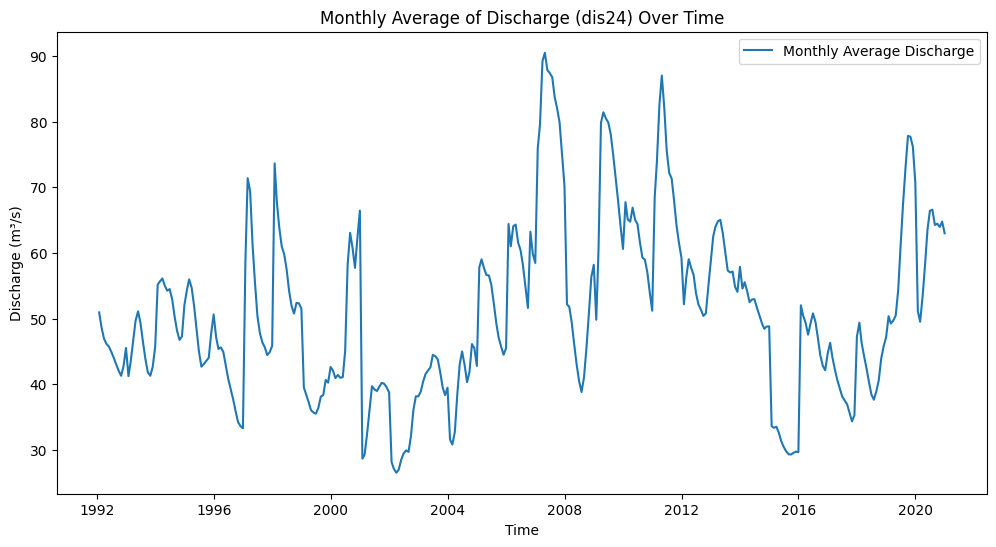

In [60]:
# Load the dataset
file_path = "MergedDataset\\full_dataset.csv"
data = pd.read_csv(file_path)

# Convert 'valid_time' to datetime and set as index for time series analysis
data['valid_time'] = pd.to_datetime(data['valid_time'], errors='coerce')
data.set_index('valid_time', inplace=True)

# Drop rows with missing 'dis24' values to focus on complete data
discharge_data = data['dis24'].dropna()

# Resample data by month to observe seasonality patterns
monthly_discharge = discharge_data.resample('M').mean()

# Plot the monthly average discharge to visualize seasonality
plt.figure(figsize=(12, 6))
plt.plot(monthly_discharge.index, monthly_discharge.values, label="Monthly Average Discharge")
plt.title("Monthly Average of Discharge (dis24) Over Time")
plt.ylabel("Discharge (m³/s)")
plt.xlabel("Time")
plt.legend()
plt.show()

## Models

### 1. Only XGBoost

#### Defining Model and Training

Model Information and Process Overview
This code utilizes a machine learning model (XGBoost Regressor) to predict flood discharge values based on a set of meteorological and hydrological features. The goal is to create an accurate prediction model for river discharge, which could then be used to anticipate and respond to potential flooding events. Here’s a breakdown of the model selection, hyperparameter tuning, and evaluation processes:

1. Choice of Model:
The XGBoost (Extreme Gradient Boosting) Regressor is used in this code. XGBoost is a powerful gradient boosting framework that builds decision trees sequentially, where each tree corrects the errors of the previous ones. It is particularly known for its speed and performance with structured data, making it suitable for tabular prediction tasks like this one.
XGBoost includes regularization terms that prevent overfitting, which is essential for complex datasets where features may interact in intricate ways.
2. Data Preprocessing:
Data Cleaning: The dataset is cleaned by removing rows with missing values in critical columns, ensuring the integrity of the data passed to the model.
Feature Engineering:
Time-based Features: Features like month and day_of_year are extracted from the date column to capture seasonal trends. This allows the model to learn any temporal patterns related to flooding and discharge changes.
Lagged Features: Lag features such as a 1-day and 7-day lag of the target variable dis24 are added. These features provide the model with information on previous discharge levels, which are often predictive of future discharge in hydrological modeling.
Data Splitting: The dataset is split into training, validation, and test sets. The training set is used to train the model, the validation set helps tune hyperparameters, and the test set evaluates final model performance.
3. Feature Scaling:
Scaling is applied to normalize features and improve the model’s ability to learn efficiently, especially since gradient-based algorithms like XGBoost can benefit from features being on a similar scale. StandardScaler is used to standardize the features, ensuring they have a mean of 0 and a standard deviation of 1.
4. Hyperparameter Tuning:
The project uses RandomizedSearchCV for hyperparameter optimization, testing various values for critical parameters of the XGBoost model:
n_estimators: The number of trees or boosting rounds. More trees can increase accuracy but also risk overfitting.
learning_rate: The rate at which the model learns. Lower values can lead to more accurate models, but the training time increases.
max_depth: Maximum depth of each tree, controlling model complexity.
subsample: The fraction of samples used per tree, preventing overfitting by not using the full dataset for every tree.
colsample_bytree: Fraction of features used for each tree, reducing correlation between trees.
RandomizedSearchCV randomly samples from the hyperparameter space to efficiently identify a set of optimal parameters, using cross-validation (CV) to evaluate each model configuration’s performance.
5. Model Training and Selection:
Once the best hyperparameters are found, the model is retrained on the entire training dataset using these optimal settings. This process allows the model to leverage the entire training data with tuned parameters, increasing predictive performance and generalizability.
6. Model Evaluation:
The model’s predictive performance is evaluated using both the validation and test sets, assessing various metrics:
Mean Absolute Error (MAE): Measures the average magnitude of prediction errors, giving insight into how close predictions are to actual values on average.
Mean Squared Error (MSE): Emphasizes larger errors by squaring them, providing a sense of the variance in prediction errors.
Root Mean Squared Error (RMSE): Square root of MSE, allowing for interpretation in the original units of dis24. Lower RMSE values indicate more accurate predictions.
Validation set performance guides model selection and tuning, while test set performance gives a measure of how well the model generalizes to unseen data.

Conclusion
This approach ensures a robust prediction pipeline by leveraging advanced machine learning techniques, feature engineering, and rigorous tuning and evaluation. By successfully predicting river discharge, this model holds potential for real-world applications in flood forecasting and disaster prevention. The use of XGBoost, alongside tailored feature engineering, allows the model to effectively capture patterns in discharge data, providing an essential tool for proactive flood management.

In [63]:
# Load data
file_path_1 = "MergedDataset\\full_dataset.csv"
data_1 = pd.read_csv(file_path_1)

# Date conversion and data cleaning
data_1['valid_time'] = pd.to_datetime(data_1['valid_time'], errors='coerce')
data_1.dropna(subset=['valid_time'], inplace=True)

# Define features and target
features_1 = ['valid_time', 'd2m', 'ro', 'cp', 'lsp', 'swvl1', 'swvl2', 'z', 'lsm', 'slor', 'tcwv']
target_1 = 'dis24'
data_1 = data_1.dropna(subset=features_1 + [target_1])

# Feature engineering
data_1['month'] = data_1['valid_time'].dt.month
data_1['day_of_year'] = data_1['valid_time'].dt.dayofyear

# Add lagged values for dis24 (1-day, 7-day)
data_1['dis24_lag1'] = data_1[target_1].shift(1)
data_1['dis24_lag7'] = data_1[target_1].shift(7)
data_1 = data_1.dropna()

# Drop unused columns
data_1 = data_1.drop(columns=['valid_time'])

# Define features and target for modeling
X_1 = data_1.drop(columns=[target_1])
y_1 = data_1[target_1]

# Split data into training, validation, and testing sets
X_train_full_1, X_test_1, y_train_full_1, y_test_1 = train_test_split(X_1, y_1, test_size=0.2, random_state=42)
X_train_1, X_val_1, y_train_1, y_val_1 = train_test_split(X_train_full_1, y_train_full_1, test_size=0.25, random_state=42)

# Scale the data
scaler_1 = StandardScaler()
X_train_1 = scaler_1.fit_transform(X_train_1)
X_val_1 = scaler_1.transform(X_val_1)
X_test_1 = scaler_1.transform(X_test_1)

# Define the XGBoost model and set up an expanded hyperparameter grid
model_1 = XGBRegressor(random_state=42, objective='reg:squarederror')
param_dist_1 = {
    'n_estimators': randint(100, 1000),
    'learning_rate': uniform(0.01, 0.1),
    'max_depth': randint(3, 10),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3)
}

# Use RandomizedSearchCV to search across more hyperparameters
random_search_1 = RandomizedSearchCV(estimator=model_1, param_distributions=param_dist_1, n_iter=50, 
                                   scoring='neg_mean_squared_error', cv=3, n_jobs=-1, random_state=42, verbose=2)
random_search_1.fit(X_train_1, y_train_1)

# Get the best model from RandomizedSearchCV
best_model_1 = random_search_1.best_estimator_
print("Best parameters found for Model 1:", random_search_1.best_params_)

# Evaluate the model on the validation set
y_val_pred_1 = best_model_1.predict(X_val_1)
val_mae_1 = mean_absolute_error(y_val_1, y_val_pred_1)
val_mse_1 = mean_squared_error(y_val_1, y_val_pred_1)
val_rmse_1 = np.sqrt(val_mse_1)

print("\nValidation Set Performance for Model 1:")
print("Mean Absolute Error (MAE):", val_mae_1)
print("Mean Squared Error (MSE):", val_mse_1)
print("Root Mean Squared Error (RMSE):", val_rmse_1)

# Final evaluation on the test set
y_test_pred_1 = best_model_1.predict(X_test_1)
test_mae_1 = mean_absolute_error(y_test_1, y_test_pred_1)
test_mse_1 = mean_squared_error(y_test_1, y_test_pred_1)
test_rmse_1 = np.sqrt(test_mse_1)

print("\nTest Set Performance for Model 1:")
print("Mean Absolute Error (MAE):", test_mae_1)
print("Mean Squared Error (MSE):", test_mse_1)
print("Root Mean Squared Error (RMSE):", test_rmse_1)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best parameters found for Model 1: {'colsample_bytree': 0.7242559978998145, 'learning_rate': 0.04696544560614045, 'max_depth': 3, 'n_estimators': 866, 'subsample': 0.9409419269139687}

Validation Set Performance for Model 1:
Mean Absolute Error (MAE): 5.293579260984434
Mean Squared Error (MSE): 201.152423874356
Root Mean Squared Error (RMSE): 14.182821435608501

Test Set Performance for Model 1:
Mean Absolute Error (MAE): 4.766554773046
Mean Squared Error (MSE): 207.75073509151972
Root Mean Squared Error (RMSE): 14.413560805419309


In [96]:
# Save the trained model and scaler
with open("best_model_1.pkl", "wb") as model_file:
    pickle.dump(best_model_1, model_file)

with open("scaler_1.pkl", "wb") as scaler_file:
    pickle.dump(scaler_1, scaler_file)

print("Model and scaler saved successfully.")

Model and scaler saved successfully.


In [97]:
# Load the model and scaler
with open("best_model_1.pkl", "rb") as model_file:
    loaded_model = pickle.load(model_file)

with open("scaler_1.pkl", "rb") as scaler_file:
    loaded_scaler = pickle.load(scaler_file)

print("Model and scaler loaded successfully.")

Model and scaler loaded successfully.


#### Plotting Results

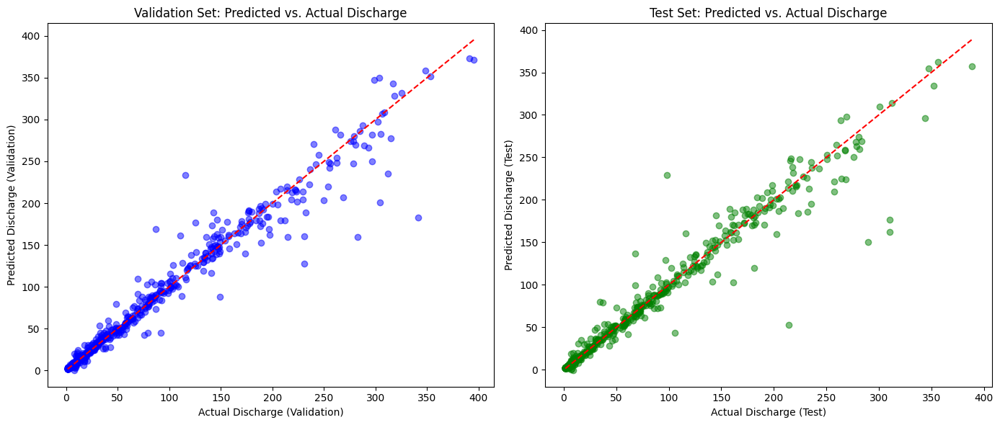

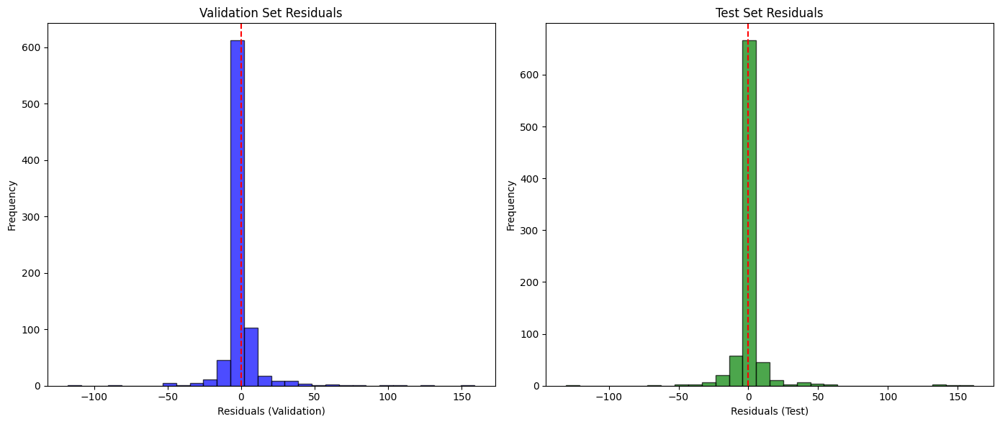

In [100]:
# Plot Predicted vs. Actual Discharge for Validation Set
plt.figure(figsize=(14, 6))

# Validation Set - Predicted vs Actual
plt.subplot(1, 2, 1)
plt.scatter(y_val_1, y_val_pred_1, alpha=0.5, color="blue")
plt.plot([y_val_1.min(), y_val_1.max()], [y_val_1.min(), y_val_1.max()], 'r--')  # Reference line for perfect predictions
plt.xlabel("Actual Discharge (Validation)")
plt.ylabel("Predicted Discharge (Validation)")
plt.title("Validation Set: Predicted vs. Actual Discharge")

# Test Set - Predicted vs Actual
plt.subplot(1, 2, 2)
plt.scatter(y_test_1, y_test_pred_1, alpha=0.5, color="green")
plt.plot([y_test_1.min(), y_test_1.max()], [y_test_1.min(), y_test_1.max()], 'r--')
plt.xlabel("Actual Discharge (Test)")
plt.ylabel("Predicted Discharge (Test)")
plt.title("Test Set: Predicted vs. Actual Discharge")

plt.tight_layout()
plt.show()

# Residuals Plot for Validation and Test Sets
plt.figure(figsize=(14, 6))

# Residuals for Validation Set
plt.subplot(1, 2, 1)
val_residuals = y_val_1 - y_val_pred_1
plt.hist(val_residuals, bins=30, color="blue", alpha=0.7, edgecolor="black")
plt.axvline(0, color="red", linestyle="--")
plt.xlabel("Residuals (Validation)")
plt.ylabel("Frequency")
plt.title("Validation Set Residuals")

# Residuals for Test Set
plt.subplot(1, 2, 2)
test_residuals = y_test_1 - y_test_pred_1
plt.hist(test_residuals, bins=30, color="green", alpha=0.7, edgecolor="black")
plt.axvline(0, color="red", linestyle="--")
plt.xlabel("Residuals (Test)")
plt.ylabel("Frequency")
plt.title("Test Set Residuals")

plt.tight_layout()
plt.show()

#### Predicting from Custom Input

In [115]:
def prepare_and_predict_loaded_model(d2m, ro, cp, lsp, swvl1, swvl2, z, lsm, slor, tcwv, dis24, valid_date, 
                                     expver=1, latitude=13.625, longitude=74.775, number=0, slt=4, surface=0):
    """
    Prepares input with the provided parameters and performs a prediction using the loaded model.
    """
    # Parse the valid_date to extract month and day_of_year
    date_obj = datetime.strptime(valid_date, "%d-%m-%Y")
    month = date_obj.month
    day_of_year = date_obj.timetuple().tm_yday

    # Create lagged values for dis24 (these can be modified based on requirements)
    dis24_lag1 = dis24
    dis24_lag7 = dis24 * 0.98  # Example of a calculated lag; adjust logic as needed

    # Assemble the input data into a DataFrame with matching column order
    input_data = {
        'd2m': d2m,
        'ro': ro,
        'cp': cp,
        'lsp': lsp,
        'swvl1': swvl1,
        'swvl2': swvl2,
        'z': z,
        'lsm': lsm,
        'slor': slor,
        'tcwv': tcwv,
        'month': month,
        'day_of_year': day_of_year,
        'dis24_lag1': dis24_lag1,
        'dis24_lag7': dis24_lag7,
        'expver': expver,
        'latitude': latitude,
        'longitude': longitude,
        'number': number,
        'slt': slt,
        'surface': surface
    }
    
    # Ensure input columns are in the same order as used in training
    expected_columns = X_1.columns  # Columns used during training
    input_df = pd.DataFrame([input_data], columns=expected_columns)
    
    # Scale the input data using the loaded scaler
    input_df_scaled = loaded_scaler.transform(input_df)
    
    # Perform the prediction using the loaded model
    predicted_discharge = loaded_model.predict(input_df_scaled)[0]
    
    # Output the prediction result with threshold check
    print("Predicted Discharge for the given inputs using loaded model:", predicted_discharge, "m³/s")
    if predicted_discharge > 1000:
        print("FLOODING TAKES PLACE")
    else:
        print("NO FLOODING")

# Example usage of the function with the loaded model and scaler
prepare_and_predict_loaded_model(
    d2m=290.0,          # Dew Point Temperature
    ro=0.00001,         # Runoff
    cp=0.5,             # Convective Precipitation
    lsp=1.2,            # Large-Scale Precipitation
    swvl1=0.2,          # Soil Water Layer 1
    swvl2=0.3,          # Soil Water Layer 2
    z=1200.0,           # Geopotential Height
    lsm=1,              # Land-Sea Mask
    slor=0.01,          # Slope of Terrain
    tcwv=20.0,          # Total Column Water Vapor
    dis24=5.5,          # Current discharge value
    valid_date="15-08-2023"  # Date in DD-MM-YYYY format
)

Predicted Discharge for the given inputs using loaded model: 40.827366 m³/s
NO FLOODING


### 2. Voting Regressor with XGBoost and LightGBM

This code trains an ensemble model using both XGBoost and LightGBM to predict river discharge values. Here is a breakdown of the key steps and components:

1. Data Loading and Cleaning
The code loads data from a CSV file, parses the valid_time field as datetime, and removes any rows with missing values.
The target variable for prediction is dis24, which represents the river discharge after a 24-hour period. The features used include various meteorological variables (e.g., dew point temperature, runoff, convective precipitation, large-scale precipitation, soil water levels, geopotential height, and total column water vapor).
2. Feature Engineering
Time-based Features: Extracts the month and day_of_year from the valid_time to capture seasonal and cyclic trends.
Cyclic Transformations: To handle the cyclic nature of month and day_of_year, sine and cosine transformations are applied, creating month_sin, month_cos, day_of_year_sin, and day_of_year_cos features.
Lagged Features: Lagged values of dis24 over different intervals (1-day, 7-day, 14-day, and 30-day) are generated to provide context on recent discharge trends, which can improve predictive accuracy.
3. Data Splitting
The data is divided into training, validation, and test sets. The test set (20% of the data) is held out for final evaluation. The remaining 80% is further split into training (60%) and validation (20%) sets, used for model training and hyperparameter tuning, respectively.
4. Scaling
StandardScaler is applied to standardize the feature values, transforming them to have a mean of 0 and standard deviation of 1. This step ensures that gradient-based models like XGBoost and LightGBM perform efficiently.
5. Model Definition and Hyperparameter Tuning
XGBoost: XGBoost is known for its performance on structured/tabular data and ability to handle non-linear relationships. The parameters tuned include:

n_estimators: Number of boosting rounds or trees.
learning_rate: Shrinkage rate for each boosting step.
max_depth: Maximum depth of each tree to control complexity.
subsample: Fraction of training samples for each tree, preventing overfitting.
colsample_bytree: Fraction of features sampled for each tree, increasing diversity among trees.
LightGBM: LightGBM is a fast and efficient gradient-boosting framework that is tuned similarly, with additional regularization parameters lambda_l1 and lambda_l2 to control L1 and L2 penalties.

RandomizedSearchCV: Both models use RandomizedSearchCV to search across the hyperparameter space. This method allows efficient hyperparameter tuning by randomly sampling combinations within a defined range and using cross-validation to select the best configuration.

6. Model Training and Cross-Validation
After hyperparameter tuning, the best model for LightGBM is retrained on different subsets of the training data using K-Fold cross-validation. The RMSE values for each fold are averaged to evaluate the model’s consistency and generalization capacity across different subsets.
7. Ensemble Model
Voting Regressor: The ensemble model combines XGBoost and LightGBM through a Voting Regressor, which averages the predictions from both models. This ensemble approach can leverage the strengths of each model, reducing prediction variance and potentially increasing accuracy.
The ensemble is trained on the entire training set and then evaluated on both validation and test sets.
8. Model Evaluation
Performance is assessed using:
Mean Absolute Error (MAE): Average absolute difference between predicted and actual values, providing an easily interpretable error metric.
Mean Squared Error (MSE): Squared differences between predicted and actual values, giving more weight to large errors.
Root Mean Squared Error (RMSE): Square root of MSE, allowing interpretation in the same units as dis24 and highlighting large deviations.
These metrics are calculated for both validation and test sets to measure the ensemble model's effectiveness and generalizability to unseen data.

Summary of Results
The print statements provide insights into the cross-validation results, validation set performance, and final test set metrics. This information is crucial to understanding how well the ensemble model is expected to perform in real-world settings.
Overall, this code sets up a robust machine learning pipeline that carefully processes data, tunes models, and assembles predictions to maximize performance in predicting river discharge, with potential applications in flood forecasting and water resource management.

#### Defining Model and Training

In [73]:
# Load data
file_path_2 = "MergedDataset/full_dataset.csv"
data_2 = pd.read_csv(file_path_2)

# Date conversion and data cleaning
data_2['valid_time'] = pd.to_datetime(data_2['valid_time'], errors='coerce')
data_2.dropna(subset=['valid_time'], inplace=True)

# Define features and target
features_2 = ['valid_time', 'd2m', 'ro', 'cp', 'lsp', 'swvl1', 'swvl2', 'z', 'lsm', 'slor', 'tcwv']
target_2 = 'dis24'
data_2 = data_2.dropna(subset=features_2 + [target_2])

# Feature engineering
data_2['month'] = data_2['valid_time'].dt.month
data_2['day_of_year'] = data_2['valid_time'].dt.dayofyear

# Sin and Cos transformations for cyclic features
data_2['month_sin'] = np.sin(2 * np.pi * data_2['month'] / 12)
data_2['month_cos'] = np.cos(2 * np.pi * data_2['month'] / 12)
data_2['day_of_year_sin'] = np.sin(2 * np.pi * data_2['day_of_year'] / 365)
data_2['day_of_year_cos'] = np.cos(2 * np.pi * data_2['day_of_year'] / 365)

# Add lag features
for lag in [1, 7, 14, 30]:
    data_2[f'dis24_lag{lag}'] = data_2[target_2].shift(lag)

# Drop rows with any NaN values (due to lag features)
data_2 = data_2.dropna()

# Drop unused columns
data_2 = data_2.drop(columns=['valid_time', 'month', 'day_of_year'])

# Define features and target for modeling
X_2 = data_2.drop(columns=[target_2])
y_2 = data_2[target_2]

# Split data into training, validation, and testing sets
X_train_full_2, X_test_2, y_train_full_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.2, random_state=42)
X_train_2, X_val_2, y_train_2, y_val_2 = train_test_split(X_train_full_2, y_train_full_2, test_size=0.25, random_state=42)

# Scale the data
scaler_2 = StandardScaler()
X_train_2 = scaler_2.fit_transform(X_train_2)
X_val_2 = scaler_2.transform(X_val_2)
X_test_2 = scaler_2.transform(X_test_2)

# Define XGBoost model and parameters
xgb_model_2 = XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_param_dist_2 = {
    'n_estimators': randint(100, 500),
    'learning_rate': uniform(0.01, 0.1),
    'max_depth': randint(3, 10),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3)
}

# Define LightGBM model parameters with added regularization
lgbm_model_2 = lgb.LGBMRegressor(objective='regression', random_state=42)
lgbm_param_dist_2 = {
    'n_estimators': randint(100, 500),
    'learning_rate': uniform(0.01, 0.1),
    'max_depth': randint(3, 10),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3),
    'lambda_l1': uniform(0.0, 1.0),  # L1 regularization
    'lambda_l2': uniform(0.0, 1.0)   # L2 regularization
}

# Hyperparameter tuning for XGBoost
xgb_search_2 = RandomizedSearchCV(estimator=xgb_model_2, param_distributions=xgb_param_dist_2, 
                                n_iter=50, scoring='neg_mean_squared_error', 
                                cv=3, n_jobs=-1, random_state=42, verbose=2)
xgb_search_2.fit(X_train_2, y_train_2)
best_xgb_model_2 = xgb_search_2.best_estimator_

# Hyperparameter tuning for LightGBM without early stopping, but with regularization
lgbm_search_2 = RandomizedSearchCV(estimator=lgbm_model_2, param_distributions=lgbm_param_dist_2, 
                                 n_iter=50, scoring='neg_mean_squared_error', 
                                 cv=3, n_jobs=-1, random_state=42, verbose=2)
lgbm_search_2.fit(X_train_2, y_train_2)

# Retrieve the best parameters for LightGBM and fit with cross-validation
best_lgbm_params_2 = lgbm_search_2.best_params_
best_lgbm_model_2 = lgb.LGBMRegressor(objective='regression', random_state=42, **best_lgbm_params_2)

# Perform cross-validation on LightGBM with KFold to monitor overfitting
kf_2 = KFold(n_splits=5, shuffle=True, random_state=42)
cv_rmse_2 = []

for train_index_2, val_index_2 in kf_2.split(X_train_2):
    X_ktrain_2, X_kval_2 = X_train_2[train_index_2], X_train_2[val_index_2]
    y_ktrain_2, y_kval_2 = y_train_2.iloc[train_index_2], y_train_2.iloc[val_index_2]
    
    # Fit the model on each fold
    best_lgbm_model_2.fit(X_ktrain_2, y_ktrain_2)
    
    # Predict and calculate RMSE for each fold
    y_kval_pred_2 = best_lgbm_model_2.predict(X_kval_2)
    fold_rmse_2 = np.sqrt(mean_squared_error(y_kval_2, y_kval_pred_2))
    cv_rmse_2.append(fold_rmse_2)

print("Cross-Validation RMSE for LightGBM (Average):", np.mean(cv_rmse_2))

# Ensemble: Voting Regressor with XGBoost and LightGBM
ensemble_model_2 = VotingRegressor(estimators=[('xgb', best_xgb_model_2), ('lgbm', best_lgbm_model_2)])
ensemble_model_2.fit(X_train_2, y_train_2)

# Evaluate on validation set
y_val_pred_2 = ensemble_model_2.predict(X_val_2)
val_mae_2 = mean_absolute_error(y_val_2, y_val_pred_2)
val_mse_2 = mean_squared_error(y_val_2, y_val_pred_2)
val_rmse_2 = np.sqrt(val_mse_2)

print("\nValidation Set Performance (Ensemble):")
print("Mean Absolute Error (MAE):", val_mae_2)
print("Mean Squared Error (MSE):", val_mse_2)
print("Root Mean Squared Error (RMSE):", val_rmse_2)

# Final evaluation on the test set
y_test_pred_2 = ensemble_model_2.predict(X_test_2)
test_mae_2 = mean_absolute_error(y_test_2, y_test_pred_2)
test_mse_2 = mean_squared_error(y_test_2, y_test_pred_2)
test_rmse_2 = np.sqrt(test_mse_2)

print("\nTest Set Performance (Ensemble):")
print("Mean Absolute Error (MAE):", test_mae_2)
print("Mean Squared Error (MSE):", test_mse_2)
print("Root Mean Squared Error (RMSE):", test_rmse_2)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Fitting 3 folds for each of 50 candidates, totalling 150 fits
[LightGBM] [Warning] lambda_l1 is set=0.29359184426449336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29359184426449336
[LightGBM] [Warning] lambda_l2 is set=0.8093611554785136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8093611554785136
[LightGBM] [Warning] lambda_l1 is set=0.29359184426449336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29359184426449336
[LightGBM] [Warning] lambda_l2 is set=0.8093611554785136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8093611554785136
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558

In [103]:
# Save the ensemble model
joblib.dump(ensemble_model_2, 'ensemble_model_2.joblib')
print("Ensemble model saved as 'ensemble_model_2.joblib'.")

# Save the scaler
joblib.dump(scaler_2, 'scaler_2.joblib')
print("Scaler saved as 'scaler_2.joblib'.")

Ensemble model saved as 'ensemble_model_2.joblib'.
Scaler saved as 'scaler_2.joblib'.


In [104]:
# Load the ensemble model
ensemble_model_2 = joblib.load('ensemble_model_2.joblib')
print("Ensemble model loaded.")

# Load the scaler
scaler_2 = joblib.load('scaler_2.joblib')
print("Scaler loaded.")

Ensemble model loaded.
Scaler loaded.


#### Plotting Results

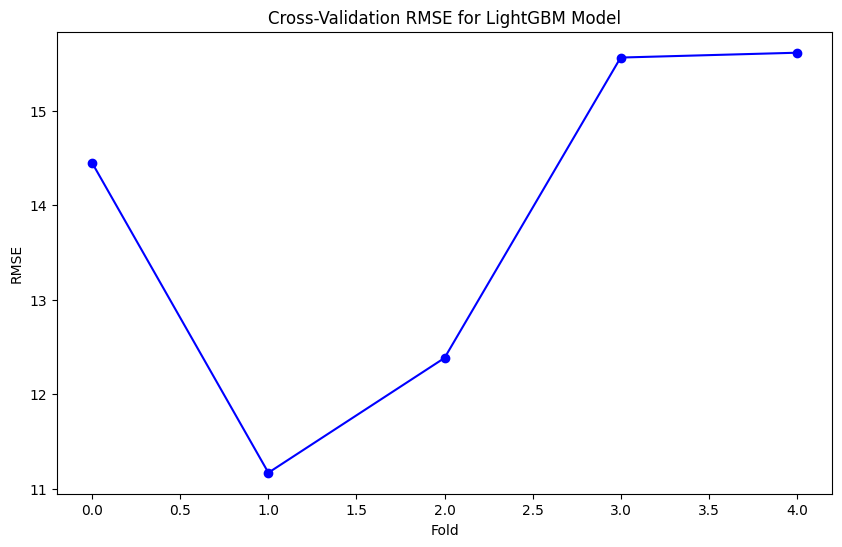

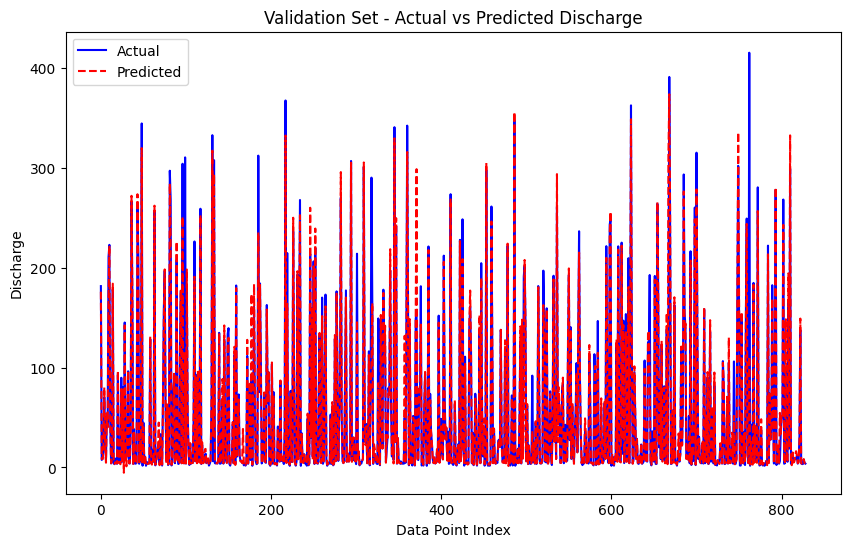

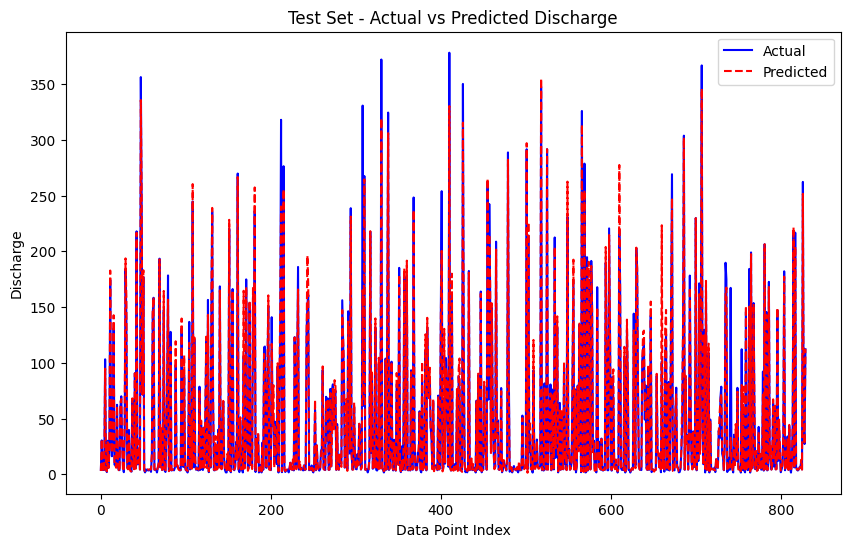

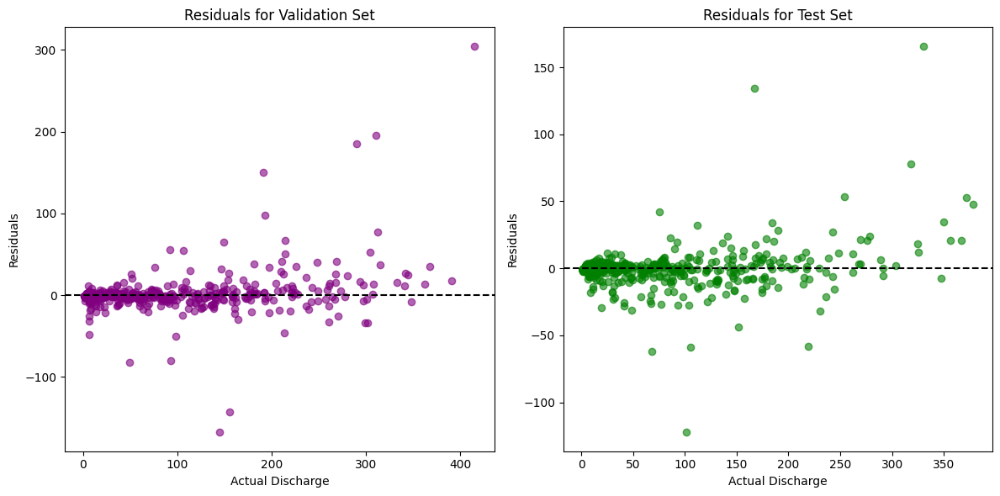

In [94]:
import matplotlib.pyplot as plt

# 1. Cross-Validation RMSE Plot
plt.figure(figsize=(10, 6))
plt.plot(cv_rmse_2, marker='o', linestyle='-', color='b')
plt.title("Cross-Validation RMSE for LightGBM Model")
plt.xlabel("Fold")
plt.ylabel("RMSE")
plt.show()

# 2. Validation Set Predictions
plt.figure(figsize=(10, 6))
plt.plot(y_val_2.values, label="Actual", color='b')
plt.plot(y_val_pred_2, label="Predicted", color='r', linestyle='--')
plt.title("Validation Set - Actual vs Predicted Discharge")
plt.xlabel("Data Point Index")
plt.ylabel("Discharge")
plt.legend()
plt.show()

# 3. Test Set Predictions
plt.figure(figsize=(10, 6))
plt.plot(y_test_2.values, label="Actual", color='b')
plt.plot(y_test_pred_2, label="Predicted", color='r', linestyle='--')
plt.title("Test Set - Actual vs Predicted Discharge")
plt.xlabel("Data Point Index")
plt.ylabel("Discharge")
plt.legend()
plt.show()

# 4. Residual Plot (Validation and Test Set)
val_residuals = y_val_2 - y_val_pred_2
test_residuals = y_test_2 - y_test_pred_2

plt.figure(figsize=(12, 6))

# Validation Residuals
plt.subplot(1, 2, 1)
plt.scatter(y_val_2, val_residuals, color='purple', alpha=0.6)
plt.axhline(y=0, color='black', linestyle='--')
plt.title("Residuals for Validation Set")
plt.xlabel("Actual Discharge")
plt.ylabel("Residuals")

# Test Residuals
plt.subplot(1, 2, 2)
plt.scatter(y_test_2, test_residuals, color='green', alpha=0.6)
plt.axhline(y=0, color='black', linestyle='--')
plt.title("Residuals for Test Set")
plt.xlabel("Actual Discharge")
plt.ylabel("Residuals")

plt.tight_layout()
plt.show()

### 3. Stacking Regressor with Optuna Hyperparameter Tuning

This code performs a data preparation and machine learning pipeline for time series regression using an ensemble approach. Here's a breakdown of each major section:

1. Data Loading and Cleaning
Loads data from a CSV file (full_dataset.csv) and parses valid_time as a datetime.
Removes rows with missing valid_time values and additional rows where any key features or target (dis24) are missing.
Creates new features from valid_time: month and day_of_year to capture seasonal patterns.
2. Feature Engineering
Adds cyclical transformations (sin and cos) for month and day_of_year to handle cyclic nature.
Creates lagged features for dis24 (the target variable) to capture time-dependent trends, with lags of 1, 7, 14, and 30 days.
Drops rows with NaN values after adding lag features since these rows lack complete data.
3. Feature Selection and Target Definition
Drops unnecessary columns (valid_time, month, day_of_year) and defines X_3 as features and y_3 as the target variable.
4. Data Splitting
Splits data into training, validation, and testing sets (80% train, 20% test; 25% of training used for validation).
Standardization: Scales features using StandardScaler for consistency across features.
5. Model Training and Hyperparameter Optimization with Optuna
Defines an Optuna optimization function (objective_3) to find optimal parameters for two models:

XGBoost (XGBRegressor)

LightGBM (LGBMRegressor)
Suggests ranges for parameters in each model (e.g., n_estimators, learning_rate, max_depth), optimizing over 50 trials.

Ensemble Model: Combines XGBoost and LightGBM in a stacking ensemble with Ridge Regression as the final estimator.

Evaluates the model on the validation set using Root Mean Squared Error (RMSE) as the optimization metric.

6. Final Model Training with Best Parameters
Trains the final ensemble model using the best parameters identified by Optuna.
Evaluates the final model on both validation and test sets using Mean Absolute Error (MAE) and Root Mean Squared Error (RMSE) to assess performance.
7. Performance Reporting
Outputs validation and test set performance metrics:
MAE: Average absolute difference between predictions and actual values.
RMSE: Square root of the average squared differences, which penalizes larger errors more heavily.
This approach aims to capture complex temporal dependencies and improve prediction accuracy using a robust ensemble method. The optimization step fine-tunes the hyperparameters for each model in the ensemble to minimize the validation error, ultimately aiming for better generalization on unseen data.

#### Defining Model and Training

In [86]:
# Load data
file_path_3 = "MergedDataset\\full_dataset.csv"
data_3 = pd.read_csv(file_path_3)

# Date conversion and data cleaning
data_3['valid_time'] = pd.to_datetime(data_3['valid_time'], errors='coerce')
data_3.dropna(subset=['valid_time'], inplace=True)

# Define features and target
features_3 = ['valid_time', 'd2m', 'ro', 'cp', 'lsp', 'swvl1', 'swvl2', 'z', 'lsm', 'slor', 'tcwv']
target_3 = 'dis24'
data_3 = data_3.dropna(subset=features_3 + [target_3])

# Feature engineering
data_3['month'] = data_3['valid_time'].dt.month
data_3['day_of_year'] = data_3['valid_time'].dt.dayofyear

# Sin and Cos transformations for cyclic features
data_3['month_sin'] = np.sin(2 * np.pi * data_3['month'] / 12)
data_3['month_cos'] = np.cos(2 * np.pi * data_3['month'] / 12)
data_3['day_of_year_sin'] = np.sin(2 * np.pi * data_3['day_of_year'] / 365)
data_3['day_of_year_cos'] = np.cos(2 * np.pi * data_3['day_of_year'] / 365)

# Add lag features
for lag in [1, 7, 14, 30]:
    data_3[f'dis24_lag{lag}'] = data_3[target_3].shift(lag)

# Drop rows with any NaN values (due to lag features)
data_3 = data_3.dropna()

# Drop unused columns
data_3 = data_3.drop(columns=['valid_time', 'month', 'day_of_year'])

# Define features and target for modeling
X_3 = data_3.drop(columns=[target_3])
y_3 = data_3[target_3]

# Split data into training, validation, and testing sets
X_train_full_3, X_test_3, y_train_full_3, y_test_3 = train_test_split(X_3, y_3, test_size=0.2, random_state=42)
X_train_3, X_val_3, y_train_3, y_val_3 = train_test_split(X_train_full_3, y_train_full_3, test_size=0.25, random_state=42)

# Scale the data
scaler_3 = StandardScaler()
X_train_3 = scaler_3.fit_transform(X_train_3)
X_val_3 = scaler_3.transform(X_val_3)
X_test_3 = scaler_3.transform(X_test_3)

# Define Optuna optimization for LightGBM and XGBoost hyperparameters
def objective_3(trial):
    xgb_params_3 = {
        'n_estimators': trial.suggest_int("xgb_n_estimators", 100, 1000),
        'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
        'max_depth': trial.suggest_int("xgb_max_depth", 3, 12),
        'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform("xgb_colsample_bytree", 0.5, 1.0),
        'random_state': 42
    }
    
    lgbm_params_3 = {
        'n_estimators': trial.suggest_int("lgbm_n_estimators", 100, 1000),
        'learning_rate': trial.suggest_loguniform("lgbm_learning_rate", 0.01, 0.1),
        'max_depth': trial.suggest_int("lgbm_max_depth", 3, 12),
        'subsample': trial.suggest_uniform("lgbm_subsample", 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform("lgbm_colsample_bytree", 0.5, 1.0),
        'lambda_l1': trial.suggest_loguniform("lgbm_lambda_l1", 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform("lgbm_lambda_l2", 1e-8, 10.0),
        'random_state': 42
    }
    
    xgb_model_3 = XGBRegressor(**xgb_params_3)
    lgbm_model_3 = LGBMRegressor(**lgbm_params_3)
    
    # Stacking Ensemble with Ridge as meta-model
    stacking_model_3 = StackingRegressor(
        estimators=[('xgb', xgb_model_3), ('lgbm', lgbm_model_3)],
        final_estimator=Ridge()
    )
    
    stacking_model_3.fit(X_train_3, y_train_3)
    y_val_pred_3 = stacking_model_3.predict(X_val_3)
    val_rmse_3 = np.sqrt(mean_squared_error(y_val_3, y_val_pred_3))
    return val_rmse_3

# Optimize hyperparameters using Optuna
study_3 = optuna.create_study(direction="minimize")
study_3.optimize(objective_3, n_trials=50)

# Retrieve the best parameters
best_params_3 = study_3.best_params
print("Best parameters found:", best_params_3)

# Train final models using the best parameters
best_xgb_params_3 = {k[4:]: v for k, v in best_params_3.items() if k.startswith("xgb_")}
best_lgbm_params_3 = {k[5:]: v for k, v in best_params_3.items() if k.startswith("lgbm_")}

best_xgb_model_3 = XGBRegressor(**best_xgb_params_3)
best_lgbm_model_3 = LGBMRegressor(**best_lgbm_params_3)

# Final ensemble model
final_ensemble_3 = StackingRegressor(
    estimators=[('xgb', best_xgb_model_3), ('lgbm', best_lgbm_model_3)],
    final_estimator=Ridge()
)
final_ensemble_3.fit(X_train_3, y_train_3)

# Evaluate on validation set
y_val_pred_3 = final_ensemble_3.predict(X_val_3)
val_mae_3 = mean_absolute_error(y_val_3, y_val_pred_3)
val_rmse_3 = np.sqrt(mean_squared_error(y_val_3, y_val_pred_3))

print("\nValidation Set Performance (Optimized Ensemble):")
print("Mean Absolute Error (MAE):", val_mae_3)
print("Root Mean Squared Error (RMSE):", val_rmse_3)

# Final evaluation on the test set
y_test_pred_3 = final_ensemble_3.predict(X_test_3)
test_mae_3 = mean_absolute_error(y_test_3, y_test_pred_3)
test_rmse_3 = np.sqrt(mean_squared_error(y_test_3, y_test_pred_3))

print("\nTest Set Performance (Optimized Ensemble):")
print("Mean Absolute Error (MAE):", test_mae_3)
print("Root Mean Squared Error (RMSE):", test_rmse_3)

[I 2024-11-10 22:53:38,967] A new study created in memory with name: no-name-13e78ef6-24be-4e49-a2c3-3041e38f410c
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/op

[LightGBM] [Warning] lambda_l1 is set=0.009039045228483977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009039045228483977
[LightGBM] [Warning] lambda_l2 is set=4.062105398942014e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062105398942014e-06
[LightGBM] [Warning] lambda_l1 is set=0.009039045228483977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009039045228483977
[LightGBM] [Warning] lambda_l2 is set=4.062105398942014e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062105398942014e-06
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:53:43,940] Trial 0 finished with value: 21.657086267923347 and parameters: {'xgb_n_estimators': 933, 'xgb_learning_rate': 0.0743242030943871, 'xgb_max_depth': 4, 'xgb_subsample': 0.9833567688460116, 'xgb_colsample_bytree': 0.7330675391708367, 'lgbm_n_estimators': 296, 'lgbm_learning_rate': 0.03867591028556326, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.6388152331084401, 'lgbm_colsample_bytree': 0.82919317322383, 'lgbm_lambda_l1': 0.009039045228483977, 'lgbm_lambda_l2': 4.062105398942014e-06}. Best is trial 0 with value: 21.657086267923347.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.4152178644093865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4152178644093865
[LightGBM] [Warning] lambda_l2 is set=0.4772752465957955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4772752465957955
[LightGBM] [Warning] lambda_l1 is set=0.4152178644093865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4152178644093865
[LightGBM] [Warning] lambda_l2 is set=0.4772752465957955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4772752465957955
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2024-11-10 22:53:55,670] Trial 1 finished with value: 21.41543188134452 and parameters: {'xgb_n_estimators': 554, 'xgb_learning_rate': 0.05041449738955938, 'xgb_max_depth': 10, 'xgb_subsample': 0.5979725573593816, 'xgb_colsample_bytree': 0.8600591858023166, 'lgbm_n_estimators': 723, 'lgbm_learning_rate': 0.03943401780195293, 'lgbm_max_depth': 5, 'lgbm_subsample': 0.6325626656142976, 'lgbm_colsample_bytree': 0.8541268540476914, 'lgbm_lambda_l1': 0.4152178644093865, 'lgbm_lambda_l2': 0.4772752465957955}. Best is trial 1 with value: 21.41543188134452.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarn

[LightGBM] [Warning] lambda_l1 is set=1.1850831518760153e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1850831518760153e-05
[LightGBM] [Warning] lambda_l2 is set=0.0005175145066647042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005175145066647042
[LightGBM] [Warning] lambda_l1 is set=1.1850831518760153e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1850831518760153e-05
[LightGBM] [Warning] lambda_l2 is set=0.0005175145066647042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005175145066647042
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:54:08,175] Trial 2 finished with value: 21.293151648640237 and parameters: {'xgb_n_estimators': 386, 'xgb_learning_rate': 0.07277875824708911, 'xgb_max_depth': 11, 'xgb_subsample': 0.6582837322050608, 'xgb_colsample_bytree': 0.6053978453236004, 'lgbm_n_estimators': 840, 'lgbm_learning_rate': 0.025855787148860335, 'lgbm_max_depth': 9, 'lgbm_subsample': 0.6832387443121106, 'lgbm_colsample_bytree': 0.5154076395172299, 'lgbm_lambda_l1': 1.1850831518760153e-05, 'lgbm_lambda_l2': 0.0005175145066647042}. Best is trial 2 with value: 21.293151648640237.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=1.380806114763911e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.380806114763911e-06
[LightGBM] [Warning] lambda_l2 is set=0.000605066405625243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000605066405625243
[LightGBM] [Warning] lambda_l1 is set=1.380806114763911e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.380806114763911e-06
[LightGBM] [Warning] lambda_l2 is set=0.000605066405625243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000605066405625243
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:54:13,442] Trial 3 finished with value: 21.242453946841692 and parameters: {'xgb_n_estimators': 556, 'xgb_learning_rate': 0.01406802701968474, 'xgb_max_depth': 6, 'xgb_subsample': 0.6043911217747764, 'xgb_colsample_bytree': 0.8073469576901883, 'lgbm_n_estimators': 705, 'lgbm_learning_rate': 0.025477865277890636, 'lgbm_max_depth': 6, 'lgbm_subsample': 0.8434189822182775, 'lgbm_colsample_bytree': 0.8067098873902693, 'lgbm_lambda_l1': 1.380806114763911e-06, 'lgbm_lambda_l2': 0.000605066405625243}. Best is trial 3 with value: 21.242453946841692.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.028415929569879074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028415929569879074
[LightGBM] [Warning] lambda_l2 is set=4.843365625111643e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.843365625111643e-05
[LightGBM] [Warning] lambda_l1 is set=0.028415929569879074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028415929569879074
[LightGBM] [Warning] lambda_l2 is set=4.843365625111643e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.843365625111643e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:54:25,425] Trial 4 finished with value: 20.452068816917517 and parameters: {'xgb_n_estimators': 888, 'xgb_learning_rate': 0.045080349072228666, 'xgb_max_depth': 8, 'xgb_subsample': 0.5888932119755785, 'xgb_colsample_bytree': 0.5495473119129347, 'lgbm_n_estimators': 972, 'lgbm_learning_rate': 0.04371170415101106, 'lgbm_max_depth': 5, 'lgbm_subsample': 0.7036286627978292, 'lgbm_colsample_bytree': 0.7126942985357251, 'lgbm_lambda_l1': 0.028415929569879074, 'lgbm_lambda_l2': 4.843365625111643e-05}. Best is trial 4 with value: 20.452068816917517.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Fut

[LightGBM] [Warning] lambda_l1 is set=2.168259789151114e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.168259789151114e-05
[LightGBM] [Warning] lambda_l2 is set=2.262537822793928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.262537822793928
[LightGBM] [Warning] lambda_l1 is set=2.168259789151114e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.168259789151114e-05
[LightGBM] [Warning] lambda_l2 is set=2.262537822793928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.262537822793928
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-11-10 22:54:31,708] Trial 5 finished with value: 20.65974432063062 and parameters: {'xgb_n_estimators': 191, 'xgb_learning_rate': 0.04861732554267597, 'xgb_max_depth': 11, 'xgb_subsample': 0.8194667059821497, 'xgb_colsample_bytree': 0.7927500712541189, 'lgbm_n_estimators': 974, 'lgbm_learning_rate': 0.09956664664431808, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.797471241176755, 'lgbm_colsample_bytree': 0.6198499910197603, 'lgbm_lambda_l1': 2.168259789151114e-05, 'lgbm_lambda_l2': 2.262537822793928}. Best is trial 4 with value: 20.452068816917517.


[LightGBM] [Warning] lambda_l1 is set=2.168259789151114e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.168259789151114e-05
[LightGBM] [Warning] lambda_l2 is set=2.262537822793928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.262537822793928
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3131
[LightGBM] [Info] Number of data points in the train set: 1990, number of used features: 15
[LightGBM] [Info] Start training from score 52.719209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.07056216367775855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07056216367775855
[LightGBM] [Warning] lambda_l2 is set=0.009171055578405635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009171055578405635
[LightGBM] [Warning] lambda_l1 is set=0.07056216367775855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07056216367775855
[LightGBM] [Warning] lambda_l2 is set=0.009171055578405635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009171055578405635
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[I 2024-11-10 22:54:39,308] Trial 6 finished with value: 21.322829416533665 and parameters: {'xgb_n_estimators': 542, 'xgb_learning_rate': 0.010817045271493247, 'xgb_max_depth': 8, 'xgb_subsample': 0.6946868879766621, 'xgb_colsample_bytree': 0.9231482771014373, 'lgbm_n_estimators': 319, 'lgbm_learning_rate': 0.08767343629954281, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.8220633383329617, 'lgbm_colsample_bytree': 0.5616124892507179, 'lgbm_lambda_l1': 0.07056216367775855, 'lgbm_lambda_l2': 0.009171055578405635}. Best is trial 4 with value: 20.452068816917517.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.0001471715356800928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001471715356800928
[LightGBM] [Warning] lambda_l2 is set=6.0820019180907165e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0820019180907165e-05
[LightGBM] [Warning] lambda_l1 is set=0.0001471715356800928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001471715356800928
[LightGBM] [Warning] lambda_l2 is set=6.0820019180907165e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0820019180907165e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:54:44,475] Trial 7 finished with value: 21.26624920200878 and parameters: {'xgb_n_estimators': 245, 'xgb_learning_rate': 0.048787908774370954, 'xgb_max_depth': 9, 'xgb_subsample': 0.7810405861036793, 'xgb_colsample_bytree': 0.7979531627911012, 'lgbm_n_estimators': 178, 'lgbm_learning_rate': 0.029820937596944822, 'lgbm_max_depth': 12, 'lgbm_subsample': 0.9352652483183411, 'lgbm_colsample_bytree': 0.8019247498027036, 'lgbm_lambda_l1': 0.0001471715356800928, 'lgbm_lambda_l2': 6.0820019180907165e-05}. Best is trial 4 with value: 20.452068816917517.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l1 is set=0.0001471715356800928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001471715356800928
[LightGBM] [Warning] lambda_l2 is set=6.0820019180907165e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0820019180907165e-05
[LightGBM] [Warning] lambda_l1 is set=0.0001471715356800928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001471715356800928
[LightGBM] [Warning] lambda_l2 is set=6.0820019180907165e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0820019180907165e-05
[LightGBM] [Warning] lambda_l1 is set=0.0001471715356800928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001471715356800928
[LightGBM] [Warning] lambda_l2 is set=6.0820019180907165e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0820019180907165e-05
[LightG

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=5.528152453565171e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.528152453565171e-07
[LightGBM] [Warning] lambda_l2 is set=0.006508144403914048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006508144403914048
[LightGBM] [Warning] lambda_l1 is set=5.528152453565171e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.528152453565171e-07
[LightGBM] [Warning] lambda_l2 is set=0.006508144403914048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006508144403914048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:54:51,117] Trial 8 finished with value: 22.696846388230394 and parameters: {'xgb_n_estimators': 337, 'xgb_learning_rate': 0.03850617832060729, 'xgb_max_depth': 10, 'xgb_subsample': 0.6029153183145021, 'xgb_colsample_bytree': 0.5504948570519376, 'lgbm_n_estimators': 115, 'lgbm_learning_rate': 0.023965281465903522, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.5310725465248978, 'lgbm_colsample_bytree': 0.6077391916577382, 'lgbm_lambda_l1': 5.528152453565171e-07, 'lgbm_lambda_l2': 0.006508144403914048}. Best is trial 4 with value: 20.452068816917517.


[LightGBM] [Warning] lambda_l1 is set=5.528152453565171e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.528152453565171e-07
[LightGBM] [Warning] lambda_l2 is set=0.006508144403914048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006508144403914048
[LightGBM] [Warning] lambda_l1 is set=5.528152453565171e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.528152453565171e-07
[LightGBM] [Warning] lambda_l2 is set=0.006508144403914048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006508144403914048
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 1989, number of used features: 15
[LightGBM] [Info] Start training from score 50.360911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=1.5936604096837241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5936604096837241
[LightGBM] [Warning] lambda_l2 is set=0.06242267906806843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06242267906806843
[LightGBM] [Warning] lambda_l1 is set=1.5936604096837241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5936604096837241
[LightGBM] [Warning] lambda_l2 is set=0.06242267906806843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06242267906806843
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[I 2024-11-10 22:55:03,921] Trial 9 finished with value: 21.155388187880575 and parameters: {'xgb_n_estimators': 493, 'xgb_learning_rate': 0.09764475872008363, 'xgb_max_depth': 11, 'xgb_subsample': 0.8345423418081015, 'xgb_colsample_bytree': 0.9556371239388893, 'lgbm_n_estimators': 235, 'lgbm_learning_rate': 0.04438025806243944, 'lgbm_max_depth': 5, 'lgbm_subsample': 0.6784091125163421, 'lgbm_colsample_bytree': 0.9454717394299668, 'lgbm_lambda_l1': 1.5936604096837241, 'lgbm_lambda_l2': 0.06242267906806843}. Best is trial 4 with value: 20.452068816917517.


[LightGBM] [Warning] lambda_l1 is set=1.5936604096837241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5936604096837241
[LightGBM] [Warning] lambda_l2 is set=0.06242267906806843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06242267906806843
[LightGBM] [Warning] lambda_l1 is set=1.5936604096837241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5936604096837241
[LightGBM] [Warning] lambda_l2 is set=0.06242267906806843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06242267906806843


C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.0024360488301875495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024360488301875495
[LightGBM] [Warning] lambda_l2 is set=2.5967223324251348e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5967223324251348e-08
[LightGBM] [Warning] lambda_l1 is set=0.0024360488301875495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024360488301875495
[LightGBM] [Warning] lambda_l2 is set=2.5967223324251348e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5967223324251348e-08
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further 

[I 2024-11-10 22:55:12,658] Trial 10 finished with value: 21.386831904212663 and parameters: {'xgb_n_estimators': 989, 'xgb_learning_rate': 0.020861840174620692, 'xgb_max_depth': 6, 'xgb_subsample': 0.5128896449930194, 'xgb_colsample_bytree': 0.6701138216524241, 'lgbm_n_estimators': 509, 'lgbm_learning_rate': 0.010550531985697555, 'lgbm_max_depth': 8, 'lgbm_subsample': 0.5191588186618302, 'lgbm_colsample_bytree': 0.6955050930145876, 'lgbm_lambda_l1': 0.0024360488301875495, 'lgbm_lambda_l2': 2.5967223324251348e-08}. Best is trial 4 with value: 20.452068816917517.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=1.0558068593590321e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0558068593590321e-08
[LightGBM] [Warning] lambda_l2 is set=3.602232692265943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.602232692265943
[LightGBM] [Warning] lambda_l1 is set=1.0558068593590321e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0558068593590321e-08
[LightGBM] [Warning] lambda_l2 is set=3.602232692265943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.602232692265943
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[I 2024-11-10 22:55:17,570] Trial 11 finished with value: 19.88525998262464 and parameters: {'xgb_n_estimators': 107, 'xgb_learning_rate': 0.02540564010959835, 'xgb_max_depth': 12, 'xgb_subsample': 0.8829964117052418, 'xgb_colsample_bytree': 0.5058070067849523, 'lgbm_n_estimators': 989, 'lgbm_learning_rate': 0.09986292028124014, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.8072363387505712, 'lgbm_colsample_bytree': 0.670602150691913, 'lgbm_lambda_l1': 1.0558068593590321e-08, 'lgbm_lambda_l2': 3.602232692265943}. Best is trial 11 with value: 19.88525998262464.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Future

[LightGBM] [Warning] lambda_l1 is set=2.1234334419092683e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1234334419092683e-08
[LightGBM] [Warning] lambda_l2 is set=2.683364462017461e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.683364462017461e-06
[LightGBM] [Warning] lambda_l1 is set=2.1234334419092683e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1234334419092683e-08
[LightGBM] [Warning] lambda_l2 is set=2.683364462017461e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.683364462017461e-06
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:55:22,333] Trial 12 finished with value: 20.52190229903043 and parameters: {'xgb_n_estimators': 776, 'xgb_learning_rate': 0.025000246793897254, 'xgb_max_depth': 3, 'xgb_subsample': 0.9674004815317374, 'xgb_colsample_bytree': 0.5217378056211989, 'lgbm_n_estimators': 988, 'lgbm_learning_rate': 0.06544469739427372, 'lgbm_max_depth': 7, 'lgbm_subsample': 0.9149183524238602, 'lgbm_colsample_bytree': 0.7055209659264052, 'lgbm_lambda_l1': 2.1234334419092683e-08, 'lgbm_lambda_l2': 2.683364462017461e-06}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] lambda_l1 is set=2.1234334419092683e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1234334419092683e-08
[LightGBM] [Warning] lambda_l2 is set=2.683364462017461e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.683364462017461e-06
[LightGBM] [Warning] lambda_l1 is set=2.1234334419092683e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1234334419092683e-08
[LightGBM] [Warning] lambda_l2 is set=2.683364462017461e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.683364462017461e-06


C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=8.834022851095659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.834022851095659
[LightGBM] [Warning] lambda_l2 is set=9.100591080504308e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.100591080504308e-06
[LightGBM] [Warning] lambda_l1 is set=8.834022851095659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.834022851095659
[LightGBM] [Warning] lambda_l2 is set=9.100591080504308e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.100591080504308e-06
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-11-10 22:55:52,317] Trial 13 finished with value: 20.51389325770589 and parameters: {'xgb_n_estimators': 750, 'xgb_learning_rate': 0.02900732398511681, 'xgb_max_depth': 12, 'xgb_subsample': 0.8886466292029246, 'xgb_colsample_bytree': 0.6107105471929855, 'lgbm_n_estimators': 835, 'lgbm_learning_rate': 0.060146058719605315, 'lgbm_max_depth': 6, 'lgbm_subsample': 0.7450654834679208, 'lgbm_colsample_bytree': 0.7019005771028343, 'lgbm_lambda_l1': 8.834022851095659, 'lgbm_lambda_l2': 9.100591080504308e-06}. Best is trial 11 with value: 19.88525998262464.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Futur

[LightGBM] [Warning] lambda_l1 is set=1.3519821396531331e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3519821396531331e-08
[LightGBM] [Warning] lambda_l2 is set=9.155283812217263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.155283812217263
[LightGBM] [Warning] lambda_l1 is set=1.3519821396531331e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3519821396531331e-08
[LightGBM] [Warning] lambda_l2 is set=9.155283812217263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.155283812217263
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[I 2024-11-10 22:56:02,597] Trial 14 finished with value: 20.78779368803061 and parameters: {'xgb_n_estimators': 713, 'xgb_learning_rate': 0.019607523236854916, 'xgb_max_depth': 7, 'xgb_subsample': 0.8985261548541535, 'xgb_colsample_bytree': 0.5109800420766067, 'lgbm_n_estimators': 520, 'lgbm_learning_rate': 0.016456454086966332, 'lgbm_max_depth': 10, 'lgbm_subsample': 0.9917897739683005, 'lgbm_colsample_bytree': 0.6301143012876284, 'lgbm_lambda_l1': 1.3519821396531331e-08, 'lgbm_lambda_l2': 9.155283812217263}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.0031678083929693526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031678083929693526
[LightGBM] [Warning] lambda_l2 is set=7.848034506579389e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.848034506579389e-08
[LightGBM] [Warning] lambda_l1 is set=0.0031678083929693526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031678083929693526
[LightGBM] [Warning] lambda_l2 is set=7.848034506579389e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.848034506579389e-08
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-10 22:56:04,365] Trial 15 finished with value: 20.315657750491155 and parameters: {'xgb_n_estimators': 108, 'xgb_learning_rate': 0.036001466345109014, 'xgb_max_depth': 5, 'xgb_subsample': 0.722554770313557, 'xgb_colsample_bytree': 0.6015977982680205, 'lgbm_n_estimators': 870, 'lgbm_learning_rate': 0.06144750934896497, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.7183590236503781, 'lgbm_colsample_bytree': 0.7537685317383751, 'lgbm_lambda_l1': 0.0031678083929693526, 'lgbm_lambda_l2': 7.848034506579389e-08}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] lambda_l1 is set=0.0031678083929693526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031678083929693526
[LightGBM] [Warning] lambda_l2 is set=7.848034506579389e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.848034506579389e-08
[LightGBM] [Warning] lambda_l1 is set=0.0031678083929693526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031678083929693526
[LightGBM] [Warning] lambda_l2 is set=7.848034506579389e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.848034506579389e-08
[LightGBM] [Warning] lambda_l1 is set=0.0031678083929693526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031678083929693526
[LightGBM] [Warning] lambda_l2 is set=7.848034506579389e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.848034506579389e-08
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.0006725475815562225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006725475815562225
[LightGBM] [Warning] lambda_l2 is set=1.2130834505872008e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2130834505872008e-08
[LightGBM] [Warning] lambda_l1 is set=0.0006725475815562225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006725475815562225
[LightGBM] [Warning] lambda_l2 is set=1.2130834505872008e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2130834505872008e-08
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:56:06,142] Trial 16 finished with value: 20.225158544585533 and parameters: {'xgb_n_estimators': 103, 'xgb_learning_rate': 0.03299277619590598, 'xgb_max_depth': 5, 'xgb_subsample': 0.7208680710801234, 'xgb_colsample_bytree': 0.661966185727594, 'lgbm_n_estimators': 820, 'lgbm_learning_rate': 0.0718892006338861, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.7791337343232152, 'lgbm_colsample_bytree': 0.9127015794555808, 'lgbm_lambda_l1': 0.0006725475815562225, 'lgbm_lambda_l2': 1.2130834505872008e-08}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.00029987138869315996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00029987138869315996
[LightGBM] [Warning] lambda_l2 is set=3.394568662683e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394568662683e-07
[LightGBM] [Warning] lambda_l1 is set=0.00029987138869315996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00029987138869315996
[LightGBM] [Warning] lambda_l2 is set=3.394568662683e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394568662683e-07
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[I 2024-11-10 22:56:09,199] Trial 17 finished with value: 20.349573949849017 and parameters: {'xgb_n_estimators': 101, 'xgb_learning_rate': 0.01790826398911276, 'xgb_max_depth': 3, 'xgb_subsample': 0.7744585751737048, 'xgb_colsample_bytree': 0.6942363622101402, 'lgbm_n_estimators': 671, 'lgbm_learning_rate': 0.07700806665698924, 'lgbm_max_depth': 11, 'lgbm_subsample': 0.8707629189326638, 'lgbm_colsample_bytree': 0.9677438343255743, 'lgbm_lambda_l1': 0.00029987138869315996, 'lgbm_lambda_l2': 3.394568662683e-07}. Best is trial 11 with value: 19.88525998262464.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Fut

[LightGBM] [Warning] lambda_l1 is set=2.5578076900611824e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5578076900611824e-07
[LightGBM] [Warning] lambda_l2 is set=0.06749420684024598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06749420684024598
[LightGBM] [Warning] lambda_l1 is set=2.5578076900611824e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5578076900611824e-07
[LightGBM] [Warning] lambda_l2 is set=0.06749420684024598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06749420684024598
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:56:12,562] Trial 18 finished with value: 21.059346331876753 and parameters: {'xgb_n_estimators': 258, 'xgb_learning_rate': 0.02825042668403279, 'xgb_max_depth': 5, 'xgb_subsample': 0.8931197433317446, 'xgb_colsample_bytree': 0.6551596550698986, 'lgbm_n_estimators': 627, 'lgbm_learning_rate': 0.07552346386755786, 'lgbm_max_depth': 7, 'lgbm_subsample': 0.7843565904480467, 'lgbm_colsample_bytree': 0.886466751993683, 'lgbm_lambda_l1': 2.5578076900611824e-07, 'lgbm_lambda_l2': 0.06749420684024598}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=7.095055689288441e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.095055689288441e-06
[LightGBM] [Warning] lambda_l2 is set=1.1322450661074578e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1322450661074578e-08
[LightGBM] [Warning] lambda_l1 is set=7.095055689288441e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.095055689288441e-06
[LightGBM] [Warning] lambda_l2 is set=1.1322450661074578e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1322450661074578e-08
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:56:18,759] Trial 19 finished with value: 21.031135278652346 and parameters: {'xgb_n_estimators': 391, 'xgb_learning_rate': 0.014896458206693388, 'xgb_max_depth': 7, 'xgb_subsample': 0.8359249870544313, 'xgb_colsample_bytree': 0.7333140172010225, 'lgbm_n_estimators': 797, 'lgbm_learning_rate': 0.05047288410326069, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.8840191914731506, 'lgbm_colsample_bytree': 0.9000449799305796, 'lgbm_lambda_l1': 7.095055689288441e-06, 'lgbm_lambda_l2': 1.1322450661074578e-08}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.00016589599368897412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00016589599368897412
[LightGBM] [Warning] lambda_l2 is set=3.372508558856934e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.372508558856934e-07
[LightGBM] [Warning] lambda_l1 is set=0.00016589599368897412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00016589599368897412
[LightGBM] [Warning] lambda_l2 is set=3.372508558856934e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.372508558856934e-07
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:56:22,241] Trial 20 finished with value: 20.460989364580925 and parameters: {'xgb_n_estimators': 199, 'xgb_learning_rate': 0.023934833634029304, 'xgb_max_depth': 5, 'xgb_subsample': 0.6699648354402513, 'xgb_colsample_bytree': 0.6343954109666535, 'lgbm_n_estimators': 906, 'lgbm_learning_rate': 0.09889834998450453, 'lgbm_max_depth': 6, 'lgbm_subsample': 0.7598128700532915, 'lgbm_colsample_bytree': 0.9977722545558767, 'lgbm_lambda_l1': 0.00016589599368897412, 'lgbm_lambda_l2': 3.372508558856934e-07}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.0027194236296306396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027194236296306396
[LightGBM] [Warning] lambda_l2 is set=1.3733408831594269e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3733408831594269e-07
[LightGBM] [Warning] lambda_l1 is set=0.0027194236296306396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027194236296306396
[LightGBM] [Warning] lambda_l2 is set=1.3733408831594269e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3733408831594269e-07
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:56:24,021] Trial 21 finished with value: 20.068207512819864 and parameters: {'xgb_n_estimators': 102, 'xgb_learning_rate': 0.03513290107306289, 'xgb_max_depth': 5, 'xgb_subsample': 0.7211154611542248, 'xgb_colsample_bytree': 0.5810122893204825, 'lgbm_n_estimators': 890, 'lgbm_learning_rate': 0.061421400083701706, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.7183526696047865, 'lgbm_colsample_bytree': 0.7742101404563163, 'lgbm_lambda_l1': 0.0027194236296306396, 'lgbm_lambda_l2': 1.3733408831594269e-07}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.0011052867711620652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011052867711620652
[LightGBM] [Warning] lambda_l2 is set=3.6027376293538486e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6027376293538486e-07
[LightGBM] [Warning] lambda_l1 is set=0.0011052867711620652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011052867711620652
[LightGBM] [Warning] lambda_l2 is set=3.6027376293538486e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6027376293538486e-07
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:56:25,670] Trial 22 finished with value: 20.442755238114916 and parameters: {'xgb_n_estimators': 154, 'xgb_learning_rate': 0.03359500922575542, 'xgb_max_depth': 4, 'xgb_subsample': 0.7510685165126432, 'xgb_colsample_bytree': 0.5692054813217076, 'lgbm_n_estimators': 784, 'lgbm_learning_rate': 0.07847880546499995, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.6031552033521551, 'lgbm_colsample_bytree': 0.7653494111288262, 'lgbm_lambda_l1': 0.0011052867711620652, 'lgbm_lambda_l2': 3.6027376293538486e-07}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=4.155536929658199e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.155536929658199e-05
[LightGBM] [Warning] lambda_l2 is set=4.8334790426501234e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8334790426501234e-08
[LightGBM] [Warning] lambda_l1 is set=4.155536929658199e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.155536929658199e-05
[LightGBM] [Warning] lambda_l2 is set=4.8334790426501234e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8334790426501234e-08
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-11-10 22:56:29,700] Trial 23 finished with value: 20.23057815009687 and parameters: {'xgb_n_estimators': 323, 'xgb_learning_rate': 0.0369792772401357, 'xgb_max_depth': 6, 'xgb_subsample': 0.7314360749567795, 'xgb_colsample_bytree': 0.5017470243136318, 'lgbm_n_estimators': 906, 'lgbm_learning_rate': 0.06168436450928381, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.7559525940523747, 'lgbm_colsample_bytree': 0.6551913576954241, 'lgbm_lambda_l1': 4.155536929658199e-05, 'lgbm_lambda_l2': 4.8334790426501234e-08}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.09345415726225753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09345415726225753
[LightGBM] [Warning] lambda_l2 is set=1.0700731423316455e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0700731423316455e-06
[LightGBM] [Warning] lambda_l1 is set=0.09345415726225753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09345415726225753
[LightGBM] [Warning] lambda_l2 is set=1.0700731423316455e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0700731423316455e-06
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:56:31,777] Trial 24 finished with value: 20.45512657400088 and parameters: {'xgb_n_estimators': 259, 'xgb_learning_rate': 0.02484398854835554, 'xgb_max_depth': 4, 'xgb_subsample': 0.7964419734861796, 'xgb_colsample_bytree': 0.5749372511722687, 'lgbm_n_estimators': 594, 'lgbm_learning_rate': 0.05586533855627929, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.8102290608604743, 'lgbm_colsample_bytree': 0.919167105048352, 'lgbm_lambda_l1': 0.09345415726225753, 'lgbm_lambda_l2': 1.0700731423316455e-06}. Best is trial 11 with value: 19.88525998262464.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Futur

[LightGBM] [Warning] lambda_l1 is set=0.0006736235289879534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006736235289879534
[LightGBM] [Warning] lambda_l2 is set=3.074798641716344e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.074798641716344e-05
[LightGBM] [Warning] lambda_l1 is set=0.0006736235289879534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006736235289879534
[LightGBM] [Warning] lambda_l2 is set=3.074798641716344e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.074798641716344e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-10 22:56:35,538] Trial 25 finished with value: 20.143268902430226 and parameters: {'xgb_n_estimators': 100, 'xgb_learning_rate': 0.03137468385340687, 'xgb_max_depth': 9, 'xgb_subsample': 0.9340971576418082, 'xgb_colsample_bytree': 0.6857386536139064, 'lgbm_n_estimators': 765, 'lgbm_learning_rate': 0.07295457288552007, 'lgbm_max_depth': 5, 'lgbm_subsample': 0.8368003743290567, 'lgbm_colsample_bytree': 0.8630564760900962, 'lgbm_lambda_l1': 0.0006736235289879534, 'lgbm_lambda_l2': 3.074798641716344e-05}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] lambda_l1 is set=0.0006736235289879534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006736235289879534
[LightGBM] [Warning] lambda_l2 is set=3.074798641716344e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.074798641716344e-05
[LightGBM] [Warning] lambda_l1 is set=0.0006736235289879534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006736235289879534
[LightGBM] [Warning] lambda_l2 is set=3.074798641716344e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.074798641716344e-05


C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.005856209774474181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005856209774474181
[LightGBM] [Warning] lambda_l2 is set=3.5769889560369786e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5769889560369786e-05
[LightGBM] [Warning] lambda_l1 is set=0.005856209774474181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005856209774474181
[LightGBM] [Warning] lambda_l2 is set=3.5769889560369786e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5769889560369786e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-10 22:56:41,840] Trial 26 finished with value: 20.241701561210213 and parameters: {'xgb_n_estimators': 177, 'xgb_learning_rate': 0.06711044721704457, 'xgb_max_depth': 9, 'xgb_subsample': 0.9388189242154942, 'xgb_colsample_bytree': 0.6822240587688377, 'lgbm_n_estimators': 924, 'lgbm_learning_rate': 0.08724552564269089, 'lgbm_max_depth': 5, 'lgbm_subsample': 0.8489875850644298, 'lgbm_colsample_bytree': 0.7825467379895363, 'lgbm_lambda_l1': 0.005856209774474181, 'lgbm_lambda_l2': 3.5769889560369786e-05}. Best is trial 11 with value: 19.88525998262464.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Fu

[LightGBM] [Warning] lambda_l1 is set=6.561045176930006e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.561045176930006e-05
[LightGBM] [Warning] lambda_l2 is set=0.009939480994224084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009939480994224084
[LightGBM] [Warning] lambda_l1 is set=6.561045176930006e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.561045176930006e-05
[LightGBM] [Warning] lambda_l2 is set=0.009939480994224084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009939480994224084
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:57:00,469] Trial 27 finished with value: 19.934191278304326 and parameters: {'xgb_n_estimators': 457, 'xgb_learning_rate': 0.057786636325867925, 'xgb_max_depth': 12, 'xgb_subsample': 0.9410897267538917, 'xgb_colsample_bytree': 0.7050351033450519, 'lgbm_n_estimators': 409, 'lgbm_learning_rate': 0.051071275534283804, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.9501311532808197, 'lgbm_colsample_bytree': 0.8524025871302913, 'lgbm_lambda_l1': 6.561045176930006e-05, 'lgbm_lambda_l2': 0.009939480994224084}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=8.274731168331267e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.274731168331267e-08
[LightGBM] [Warning] lambda_l2 is set=0.004006681272571839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004006681272571839
[LightGBM] [Warning] lambda_l1 is set=8.274731168331267e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.274731168331267e-08
[LightGBM] [Warning] lambda_l2 is set=0.004006681272571839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004006681272571839
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:57:18,624] Trial 28 finished with value: 20.776208135059107 and parameters: {'xgb_n_estimators': 467, 'xgb_learning_rate': 0.05797652132686856, 'xgb_max_depth': 12, 'xgb_subsample': 0.8683764511541642, 'xgb_colsample_bytree': 0.8484193112601005, 'lgbm_n_estimators': 423, 'lgbm_learning_rate': 0.05102861006810758, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.9608797978193551, 'lgbm_colsample_bytree': 0.6663129172139919, 'lgbm_lambda_l1': 8.274731168331267e-08, 'lgbm_lambda_l2': 0.004006681272571839}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=0.01675677397496845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01675677397496845
[LightGBM] [Warning] lambda_l2 is set=0.23966867096534647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23966867096534647
[LightGBM] [Warning] lambda_l1 is set=0.01675677397496845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01675677397496845
[LightGBM] [Warning] lambda_l2 is set=0.23966867096534647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23966867096534647
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-11-10 22:57:31,727] Trial 29 finished with value: 20.231778822175603 and parameters: {'xgb_n_estimators': 677, 'xgb_learning_rate': 0.09592779932395601, 'xgb_max_depth': 12, 'xgb_subsample': 0.9911134731692302, 'xgb_colsample_bytree': 0.7334608397163681, 'lgbm_n_estimators': 382, 'lgbm_learning_rate': 0.03444995132365323, 'lgbm_max_depth': 3, 'lgbm_subsample': 0.5746203771595312, 'lgbm_colsample_bytree': 0.833601300369486, 'lgbm_lambda_l1': 0.01675677397496845, 'lgbm_lambda_l2': 0.23966867096534647}. Best is trial 11 with value: 19.88525998262464.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Future

[LightGBM] [Warning] lambda_l1 is set=2.9260543884991052e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9260543884991052e-06
[LightGBM] [Warning] lambda_l2 is set=0.001724865715407705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001724865715407705
[LightGBM] [Warning] lambda_l1 is set=2.9260543884991052e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9260543884991052e-06
[LightGBM] [Warning] lambda_l2 is set=0.001724865715407705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001724865715407705
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-10 22:57:43,316] Trial 30 finished with value: 20.522091972893683 and parameters: {'xgb_n_estimators': 297, 'xgb_learning_rate': 0.058497153229234725, 'xgb_max_depth': 11, 'xgb_subsample': 0.9384935811217329, 'xgb_colsample_bytree': 0.538606442927446, 'lgbm_n_estimators': 393, 'lgbm_learning_rate': 0.04951793724087429, 'lgbm_max_depth': 8, 'lgbm_subsample': 0.9042466075578381, 'lgbm_colsample_bytree': 0.7455044040651452, 'lgbm_lambda_l1': 2.9260543884991052e-06, 'lgbm_lambda_l2': 0.001724865715407705}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=6.56130192497693e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.56130192497693e-05
[LightGBM] [Warning] lambda_l2 is set=0.00014219292160069043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014219292160069043
[LightGBM] [Warning] lambda_l1 is set=6.56130192497693e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.56130192497693e-05
[LightGBM] [Warning] lambda_l2 is set=0.00014219292160069043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014219292160069043
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-10 22:57:48,901] Trial 31 finished with value: 20.111631935634765 and parameters: {'xgb_n_estimators': 157, 'xgb_learning_rate': 0.04097337599122517, 'xgb_max_depth': 10, 'xgb_subsample': 0.9291376750568723, 'xgb_colsample_bytree': 0.7671883005616686, 'lgbm_n_estimators': 765, 'lgbm_learning_rate': 0.08782651932904256, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.988121234784856, 'lgbm_colsample_bytree': 0.8070854337620486, 'lgbm_lambda_l1': 6.56130192497693e-05, 'lgbm_lambda_l2': 0.00014219292160069043}. Best is trial 11 with value: 19.88525998262464.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Fu

[LightGBM] [Warning] lambda_l1 is set=2.7757991420171676e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7757991420171676e-05
[LightGBM] [Warning] lambda_l2 is set=0.042032307041582936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042032307041582936
[LightGBM] [Warning] lambda_l1 is set=2.7757991420171676e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7757991420171676e-05
[LightGBM] [Warning] lambda_l2 is set=0.042032307041582936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042032307041582936
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-10 22:58:05,632] Trial 32 finished with value: 20.024356803456516 and parameters: {'xgb_n_estimators': 625, 'xgb_learning_rate': 0.04006118581142584, 'xgb_max_depth': 10, 'xgb_subsample': 0.9585659645806004, 'xgb_colsample_bytree': 0.7687966304325086, 'lgbm_n_estimators': 477, 'lgbm_learning_rate': 0.08794275513317536, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.9986416551898067, 'lgbm_colsample_bytree': 0.8322155972764247, 'lgbm_lambda_l1': 2.7757991420171676e-05, 'lgbm_lambda_l2': 0.042032307041582936}. Best is trial 11 with value: 19.88525998262464.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l1 is set=2.7757991420171676e-05, reg_alpha=0.0 will be ignored. Current

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=3.5712825970355977e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5712825970355977e-06
[LightGBM] [Warning] lambda_l2 is set=0.053497927409148965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053497927409148965
[LightGBM] [Warning] lambda_l1 is set=3.5712825970355977e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5712825970355977e-06
[LightGBM] [Warning] lambda_l2 is set=0.053497927409148965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053497927409148965
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-11-10 22:58:24,992] Trial 33 finished with value: 19.84685932571804 and parameters: {'xgb_n_estimators': 624, 'xgb_learning_rate': 0.06004669324516346, 'xgb_max_depth': 12, 'xgb_subsample': 0.9778269569020079, 'xgb_colsample_bytree': 0.8735039560177358, 'lgbm_n_estimators': 449, 'lgbm_learning_rate': 0.03921113180439801, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.9564552963493158, 'lgbm_colsample_bytree': 0.8416420422592241, 'lgbm_lambda_l1': 3.5712825970355977e-06, 'lgbm_lambda_l2': 0.053497927409148965}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] lambda_l1 is set=3.5712825970355977e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5712825970355977e-06
[LightGBM] [Warning] lambda_l2 is set=0.053497927409148965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053497927409148965
[LightGBM] [Warning] lambda_l1 is set=3.5712825970355977e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5712825970355977e-06
[LightGBM] [Warning] lambda_l2 is set=0.053497927409148965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053497927409148965
[LightGBM] [Warning] lambda_l1 is set=3.5712825970355977e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5712825970355977e-06
[LightGBM] [Warning] lambda_l2 is set=0.053497927409148965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053497927409148965
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=3.407738101902677e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.407738101902677e-06
[LightGBM] [Warning] lambda_l2 is set=0.043081251421311306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043081251421311306
[LightGBM] [Warning] lambda_l1 is set=3.407738101902677e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.407738101902677e-06
[LightGBM] [Warning] lambda_l2 is set=0.043081251421311306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043081251421311306
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:58:45,265] Trial 34 finished with value: 20.200331415262703 and parameters: {'xgb_n_estimators': 626, 'xgb_learning_rate': 0.06084264595645079, 'xgb_max_depth': 12, 'xgb_subsample': 0.9682243693469866, 'xgb_colsample_bytree': 0.8825019381870673, 'lgbm_n_estimators': 471, 'lgbm_learning_rate': 0.03767481941132585, 'lgbm_max_depth': 6, 'lgbm_subsample': 0.9516507793376633, 'lgbm_colsample_bytree': 0.860002595774273, 'lgbm_lambda_l1': 3.407738101902677e-06, 'lgbm_lambda_l2': 0.043081251421311306}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=7.706746694037322e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.706746694037322e-08
[LightGBM] [Warning] lambda_l2 is set=0.7527325551147984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7527325551147984
[LightGBM] [Warning] lambda_l1 is set=7.706746694037322e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.706746694037322e-08
[LightGBM] [Warning] lambda_l2 is set=0.7527325551147984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7527325551147984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[I 2024-11-10 22:59:00,239] Trial 35 finished with value: 20.30584848724148 and parameters: {'xgb_n_estimators': 635, 'xgb_learning_rate': 0.08026212597020213, 'xgb_max_depth': 11, 'xgb_subsample': 0.9971985083536903, 'xgb_colsample_bytree': 0.8337191871481472, 'lgbm_n_estimators': 281, 'lgbm_learning_rate': 0.020201038594637722, 'lgbm_max_depth': 5, 'lgbm_subsample': 0.9810247748464109, 'lgbm_colsample_bytree': 0.8342239043763549, 'lgbm_lambda_l1': 7.706746694037322e-08, 'lgbm_lambda_l2': 0.7527325551147984}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] lambda_l1 is set=7.706746694037322e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.706746694037322e-08
[LightGBM] [Warning] lambda_l2 is set=0.7527325551147984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7527325551147984


C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=1.2534560667224077e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2534560667224077e-06
[LightGBM] [Warning] lambda_l2 is set=0.01689880445177611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01689880445177611
[LightGBM] [Warning] lambda_l1 is set=1.2534560667224077e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2534560667224077e-06
[LightGBM] [Warning] lambda_l2 is set=0.01689880445177611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01689880445177611
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 22:59:16,882] Trial 36 finished with value: 20.62059436609757 and parameters: {'xgb_n_estimators': 821, 'xgb_learning_rate': 0.07850952829641941, 'xgb_max_depth': 10, 'xgb_subsample': 0.8705561597130805, 'xgb_colsample_bytree': 0.879794631323404, 'lgbm_n_estimators': 577, 'lgbm_learning_rate': 0.04168923919931516, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.9172544913266084, 'lgbm_colsample_bytree': 0.731500522653779, 'lgbm_lambda_l1': 1.2534560667224077e-06, 'lgbm_lambda_l2': 0.01689880445177611}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=9.946663850193933e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.946663850193933e-06
[LightGBM] [Warning] lambda_l2 is set=0.2182358355600535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2182358355600535
[LightGBM] [Warning] lambda_l1 is set=9.946663850193933e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.946663850193933e-06
[LightGBM] [Warning] lambda_l2 is set=0.2182358355600535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2182358355600535
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[I 2024-11-10 22:59:40,782] Trial 37 finished with value: 21.111429844504134 and parameters: {'xgb_n_estimators': 591, 'xgb_learning_rate': 0.042149306693737294, 'xgb_max_depth': 12, 'xgb_subsample': 0.9615248251431987, 'xgb_colsample_bytree': 0.7674084850837228, 'lgbm_n_estimators': 453, 'lgbm_learning_rate': 0.09887246875171686, 'lgbm_max_depth': 5, 'lgbm_subsample': 0.9611836659322228, 'lgbm_colsample_bytree': 0.5112477404959708, 'lgbm_lambda_l1': 9.946663850193933e-06, 'lgbm_lambda_l2': 0.2182358355600535}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=3.866970002515183e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.866970002515183e-05
[LightGBM] [Warning] lambda_l2 is set=3.9940037763859673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9940037763859673
[LightGBM] [Warning] lambda_l1 is set=3.866970002515183e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.866970002515183e-05
[LightGBM] [Warning] lambda_l2 is set=3.9940037763859673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9940037763859673
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[I 2024-11-10 22:59:56,365] Trial 38 finished with value: 19.86378309288872 and parameters: {'xgb_n_estimators': 424, 'xgb_learning_rate': 0.05118603875157868, 'xgb_max_depth': 11, 'xgb_subsample': 0.9084484713915209, 'xgb_colsample_bytree': 0.998551040024753, 'lgbm_n_estimators': 337, 'lgbm_learning_rate': 0.029655078768695935, 'lgbm_max_depth': 6, 'lgbm_subsample': 0.8780563141986598, 'lgbm_colsample_bytree': 0.8824066027652, 'lgbm_lambda_l1': 3.866970002515183e-05, 'lgbm_lambda_l2': 3.9940037763859673}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=1.280028160916196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.280028160916196e-07
[LightGBM] [Warning] lambda_l2 is set=6.942880701475892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.942880701475892
[LightGBM] [Warning] lambda_l1 is set=1.280028160916196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.280028160916196e-07
[LightGBM] [Warning] lambda_l2 is set=6.942880701475892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.942880701475892
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-11-10 23:00:14,997] Trial 39 finished with value: 20.76785828241463 and parameters: {'xgb_n_estimators': 429, 'xgb_learning_rate': 0.04774223774730942, 'xgb_max_depth': 12, 'xgb_subsample': 0.9100379029679402, 'xgb_colsample_bytree': 0.98586700685634, 'lgbm_n_estimators': 348, 'lgbm_learning_rate': 0.029019533153350624, 'lgbm_max_depth': 6, 'lgbm_subsample': 0.877137922366921, 'lgbm_colsample_bytree': 0.5727282635534319, 'lgbm_lambda_l1': 1.280028160916196e-07, 'lgbm_lambda_l2': 6.942880701475892}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=6.84380447795137e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.84380447795137e-07
[LightGBM] [Warning] lambda_l2 is set=1.619870488393013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.619870488393013
[LightGBM] [Warning] lambda_l1 is set=6.84380447795137e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.84380447795137e-07
[LightGBM] [Warning] lambda_l2 is set=1.619870488393013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.619870488393013
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[I 2024-11-10 23:00:32,938] Trial 40 finished with value: 20.54793037154251 and parameters: {'xgb_n_estimators': 522, 'xgb_learning_rate': 0.054227474538272945, 'xgb_max_depth': 11, 'xgb_subsample': 0.8560230575317906, 'xgb_colsample_bytree': 0.9200673612604207, 'lgbm_n_estimators': 236, 'lgbm_learning_rate': 0.03410608694660706, 'lgbm_max_depth': 7, 'lgbm_subsample': 0.9379037913816531, 'lgbm_colsample_bytree': 0.8763848947917607, 'lgbm_lambda_l1': 6.84380447795137e-07, 'lgbm_lambda_l2': 1.619870488393013}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=2.844808094392962e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.844808094392962e-05
[LightGBM] [Warning] lambda_l2 is set=0.001315397383499566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001315397383499566
[LightGBM] [Warning] lambda_l1 is set=2.844808094392962e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.844808094392962e-05
[LightGBM] [Warning] lambda_l2 is set=0.001315397383499566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001315397383499566
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 23:00:50,118] Trial 41 finished with value: 20.250280040776264 and parameters: {'xgb_n_estimators': 594, 'xgb_learning_rate': 0.0653107199633303, 'xgb_max_depth': 10, 'xgb_subsample': 0.9561801443050147, 'xgb_colsample_bytree': 0.9990662352344056, 'lgbm_n_estimators': 474, 'lgbm_learning_rate': 0.021327996894857745, 'lgbm_max_depth': 4, 'lgbm_subsample': 0.907086261065537, 'lgbm_colsample_bytree': 0.8147368274784809, 'lgbm_lambda_l1': 2.844808094392962e-05, 'lgbm_lambda_l2': 0.001315397383499566}. Best is trial 33 with value: 19.84685932571804.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Fut

[LightGBM] [Warning] lambda_l1 is set=7.51377443630392e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.51377443630392e-05
[LightGBM] [Warning] lambda_l2 is set=2.5541607720818265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5541607720818265
[LightGBM] [Warning] lambda_l1 is set=7.51377443630392e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.51377443630392e-05
[LightGBM] [Warning] lambda_l2 is set=2.5541607720818265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5541607720818265
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-11-10 23:01:04,700] Trial 42 finished with value: 20.143272321788803 and parameters: {'xgb_n_estimators': 438, 'xgb_learning_rate': 0.04989961396279131, 'xgb_max_depth': 11, 'xgb_subsample': 0.9229871659706106, 'xgb_colsample_bytree': 0.9173908572527929, 'lgbm_n_estimators': 295, 'lgbm_learning_rate': 0.026455572810601048, 'lgbm_max_depth': 5, 'lgbm_subsample': 0.8547391279991386, 'lgbm_colsample_bytree': 0.8382915525240263, 'lgbm_lambda_l1': 7.51377443630392e-05, 'lgbm_lambda_l2': 2.5541607720818265}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lamb

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=1.3969726753424841e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3969726753424841e-05
[LightGBM] [Warning] lambda_l2 is set=0.18854930409960022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18854930409960022
[LightGBM] [Warning] lambda_l1 is set=1.3969726753424841e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3969726753424841e-05
[LightGBM] [Warning] lambda_l2 is set=0.18854930409960022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18854930409960022
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[I 2024-11-10 23:01:19,099] Trial 43 finished with value: 19.956353783119752 and parameters: {'xgb_n_estimators': 380, 'xgb_learning_rate': 0.045196476050011265, 'xgb_max_depth': 11, 'xgb_subsample': 0.9980472147572049, 'xgb_colsample_bytree': 0.9467325573135013, 'lgbm_n_estimators': 529, 'lgbm_learning_rate': 0.03817744021873052, 'lgbm_max_depth': 9, 'lgbm_subsample': 0.969254173234371, 'lgbm_colsample_bytree': 0.9441793094623837, 'lgbm_lambda_l1': 1.3969726753424841e-05, 'lgbm_lambda_l2': 0.18854930409960022}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=4.258959068930531e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258959068930531e-06
[LightGBM] [Warning] lambda_l2 is set=0.42079722963099647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.42079722963099647
[LightGBM] [Warning] lambda_l1 is set=4.258959068930531e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258959068930531e-06
[LightGBM] [Warning] lambda_l2 is set=0.42079722963099647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.42079722963099647
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[I 2024-11-10 23:01:33,348] Trial 44 finished with value: 19.900731362770443 and parameters: {'xgb_n_estimators': 378, 'xgb_learning_rate': 0.07189286832064974, 'xgb_max_depth': 11, 'xgb_subsample': 0.9994746325136363, 'xgb_colsample_bytree': 0.9519342870348888, 'lgbm_n_estimators': 550, 'lgbm_learning_rate': 0.03852220230972435, 'lgbm_max_depth': 10, 'lgbm_subsample': 0.9354407892163648, 'lgbm_colsample_bytree': 0.9481559905295078, 'lgbm_lambda_l1': 4.258959068930531e-06, 'lgbm_lambda_l2': 0.42079722963099647}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] lambda_l1 is set=4.258959068930531e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258959068930531e-06
[LightGBM] [Warning] lambda_l2 is set=0.42079722963099647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.42079722963099647
[LightGBM] [Warning] lambda_l1 is set=4.258959068930531e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258959068930531e-06
[LightGBM] [Warning] lambda_l2 is set=0.42079722963099647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.42079722963099647


C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=4.7088598841821024e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7088598841821024e-06
[LightGBM] [Warning] lambda_l2 is set=0.7333421454467813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7333421454467813
[LightGBM] [Warning] lambda_l1 is set=4.7088598841821024e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7088598841821024e-06
[LightGBM] [Warning] lambda_l2 is set=0.7333421454467813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7333421454467813
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[I 2024-11-10 23:01:50,048] Trial 45 finished with value: 20.259192310229253 and parameters: {'xgb_n_estimators': 498, 'xgb_learning_rate': 0.08883984083570479, 'xgb_max_depth': 12, 'xgb_subsample': 0.9802903724979181, 'xgb_colsample_bytree': 0.96106199108353, 'lgbm_n_estimators': 660, 'lgbm_learning_rate': 0.04617439962428281, 'lgbm_max_depth': 12, 'lgbm_subsample': 0.8935428639891871, 'lgbm_colsample_bytree': 0.9322660868158779, 'lgbm_lambda_l1': 4.7088598841821024e-06, 'lgbm_lambda_l2': 0.7333421454467813}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] lambda_l1 is set=4.7088598841821024e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7088598841821024e-06
[LightGBM] [Warning] lambda_l2 is set=0.7333421454467813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7333421454467813
[LightGBM] [Warning] lambda_l1 is set=4.7088598841821024e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7088598841821024e-06
[LightGBM] [Warning] lambda_l2 is set=0.7333421454467813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7333421454467813


C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=1.0931462826239625e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0931462826239625e-06
[LightGBM] [Warning] lambda_l2 is set=4.9471579067532785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9471579067532785
[LightGBM] [Warning] lambda_l1 is set=1.0931462826239625e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0931462826239625e-06
[LightGBM] [Warning] lambda_l2 is set=4.9471579067532785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9471579067532785
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[I 2024-11-10 23:02:02,849] Trial 46 finished with value: 20.25252856847037 and parameters: {'xgb_n_estimators': 362, 'xgb_learning_rate': 0.06955748032840514, 'xgb_max_depth': 11, 'xgb_subsample': 0.9126564622858562, 'xgb_colsample_bytree': 0.898462572902997, 'lgbm_n_estimators': 353, 'lgbm_learning_rate': 0.0319770472745602, 'lgbm_max_depth': 9, 'lgbm_subsample': 0.94216204114694, 'lgbm_colsample_bytree': 0.9831898919458769, 'lgbm_lambda_l1': 1.0931462826239625e-06, 'lgbm_lambda_l2': 4.9471579067532785}. Best is trial 33 with value: 19.84685932571804.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWa

[LightGBM] [Warning] lambda_l1 is set=2.7529986190140425e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7529986190140425e-08
[LightGBM] [Warning] lambda_l2 is set=0.4250887368454329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4250887368454329
[LightGBM] [Warning] lambda_l1 is set=2.7529986190140425e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7529986190140425e-08
[LightGBM] [Warning] lambda_l2 is set=0.4250887368454329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4250887368454329
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[I 2024-11-10 23:02:21,047] Trial 47 finished with value: 20.68353990495177 and parameters: {'xgb_n_estimators': 422, 'xgb_learning_rate': 0.07637522315477158, 'xgb_max_depth': 12, 'xgb_subsample': 0.8777414314432193, 'xgb_colsample_bytree': 0.9730611501248257, 'lgbm_n_estimators': 412, 'lgbm_learning_rate': 0.015854772800836827, 'lgbm_max_depth': 11, 'lgbm_subsample': 0.9292665093503821, 'lgbm_colsample_bytree': 0.8959802291293191, 'lgbm_lambda_l1': 2.7529986190140425e-08, 'lgbm_lambda_l2': 0.4250887368454329}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform("xgb_subsample", 0.5, 1.0),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform("xgb_colsa

[LightGBM] [Warning] lambda_l1 is set=3.078082623003073e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.078082623003073e-07
[LightGBM] [Warning] lambda_l2 is set=1.3734443784529382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3734443784529382
[LightGBM] [Warning] lambda_l1 is set=3.078082623003073e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.078082623003073e-07
[LightGBM] [Warning] lambda_l2 is set=1.3734443784529382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3734443784529382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

[I 2024-11-10 23:02:35,679] Trial 48 finished with value: 20.304401714159404 and parameters: {'xgb_n_estimators': 497, 'xgb_learning_rate': 0.05312314940155254, 'xgb_max_depth': 10, 'xgb_subsample': 0.8390176199060679, 'xgb_colsample_bytree': 0.8203129114778185, 'lgbm_n_estimators': 564, 'lgbm_learning_rate': 0.027834964025482658, 'lgbm_max_depth': 8, 'lgbm_subsample': 0.8378620447132571, 'lgbm_colsample_bytree': 0.9714558999978937, 'lgbm_lambda_l1': 3.078082623003073e-07, 'lgbm_lambda_l2': 1.3734443784529382}. Best is trial 33 with value: 19.84685932571804.
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:52: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("xgb_learning_rate", 0.01, 0.1),
C:\Users\Subhodeep Dey\AppData\Local\Temp\ipykernel_5416\4117993867.py:54: Fut

[LightGBM] [Warning] lambda_l1 is set=9.733044957163887e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.733044957163887e-05
[LightGBM] [Warning] lambda_l2 is set=0.01862287313258884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01862287313258884
[LightGBM] [Warning] lambda_l1 is set=9.733044957163887e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.733044957163887e-05
[LightGBM] [Warning] lambda_l2 is set=0.01862287313258884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01862287313258884
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 2487, number of used features: 15
[LightGBM] [Info] Start training from score 51.558812
[LightGBM] [Warning] lambda_l1 is set=9.733044957163887e-05, reg_alpha=0.0 will be ignored. Current value: l

[I 2024-11-10 23:02:54,063] Trial 49 finished with value: 20.65142284420081 and parameters: {'xgb_n_estimators': 563, 'xgb_learning_rate': 0.06342277952335248, 'xgb_max_depth': 11, 'xgb_subsample': 0.9417467507589637, 'xgb_colsample_bytree': 0.9432300387587852, 'lgbm_n_estimators': 165, 'lgbm_learning_rate': 0.023933360905218255, 'lgbm_max_depth': 10, 'lgbm_subsample': 0.8672079680939608, 'lgbm_colsample_bytree': 0.9505083095397278, 'lgbm_lambda_l1': 9.733044957163887e-05, 'lgbm_lambda_l2': 0.01862287313258884}. Best is trial 33 with value: 19.84685932571804.


[LightGBM] [Warning] lambda_l1 is set=9.733044957163887e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.733044957163887e-05
[LightGBM] [Warning] lambda_l2 is set=0.01862287313258884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01862287313258884
[LightGBM] [Warning] lambda_l1 is set=9.733044957163887e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.733044957163887e-05
[LightGBM] [Warning] lambda_l2 is set=0.01862287313258884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01862287313258884
[LightGBM] [Warning] lambda_l1 is set=9.733044957163887e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.733044957163887e-05
[LightGBM] [Warning] lambda_l2 is set=0.01862287313258884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01862287313258884
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

In [111]:
# Save the final ensemble model
joblib.dump(final_ensemble_3, 'final_ensemble_3.joblib')
print("Ensemble model saved as 'final_ensemble_3.joblib'.")

# Save the scaler
joblib.dump(scaler_3, 'scaler_3.joblib')
print("Scaler saved as 'scaler_3.joblib'.")

Ensemble model saved as 'final_ensemble_3.joblib'.
Scaler saved as 'scaler_3.joblib'.


In [112]:
# Load the ensemble model
final_ensemble_3 = joblib.load('final_ensemble_3.joblib')
print("Ensemble model loaded.")

# Load the scaler
scaler_3 = joblib.load('scaler_3.joblib')
print("Scaler loaded.")

Ensemble model loaded.
Scaler loaded.


#### Plotting Results

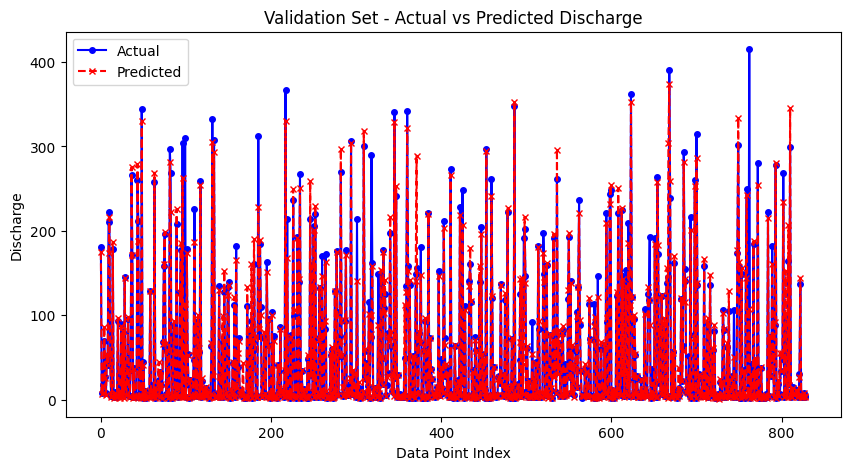

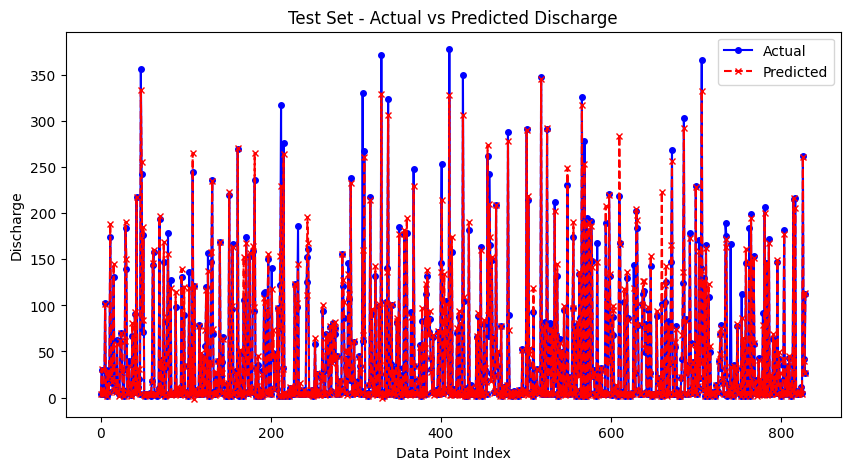

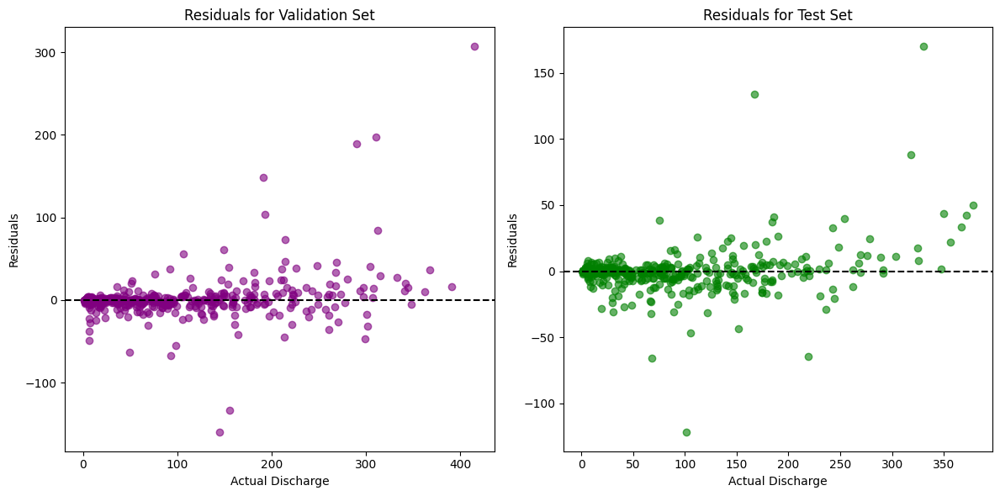

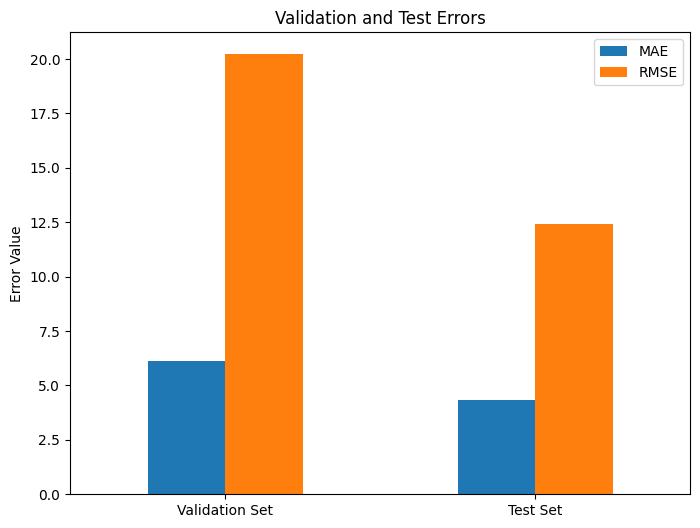

In [87]:
import matplotlib.pyplot as plt

# 1. Validation Set Predictions vs Actual
plt.figure(figsize=(10, 5))
plt.plot(y_val_3.values, label="Actual", color="b", marker='o', linestyle='-', markersize=4)
plt.plot(y_val_pred_3, label="Predicted", color="r", linestyle='--', marker='x', markersize=4)
plt.title("Validation Set - Actual vs Predicted Discharge")
plt.xlabel("Data Point Index")
plt.ylabel("Discharge")
plt.legend()
plt.show()

# 2. Test Set Predictions vs Actual
plt.figure(figsize=(10, 5))
plt.plot(y_test_3.values, label="Actual", color="b", marker='o', linestyle='-', markersize=4)
plt.plot(y_test_pred_3, label="Predicted", color="r", linestyle='--', marker='x', markersize=4)
plt.title("Test Set - Actual vs Predicted Discharge")
plt.xlabel("Data Point Index")
plt.ylabel("Discharge")
plt.legend()
plt.show()

# 3. Residual Plot for Validation and Test Sets
val_residuals_3 = y_val_3 - y_val_pred_3
test_residuals_3 = y_test_3 - y_test_pred_3

plt.figure(figsize=(12, 6))

# Validation Residuals
plt.subplot(1, 2, 1)
plt.scatter(y_val_3, val_residuals_3, color="purple", alpha=0.6)
plt.axhline(y=0, color="black", linestyle="--")
plt.title("Residuals for Validation Set")
plt.xlabel("Actual Discharge")
plt.ylabel("Residuals")

# Test Residuals
plt.subplot(1, 2, 2)
plt.scatter(y_test_3, test_residuals_3, color="green", alpha=0.6)
plt.axhline(y=0, color="black", linestyle="--")
plt.title("Residuals for Test Set")
plt.xlabel("Actual Discharge")
plt.ylabel("Residuals")

plt.tight_layout()
plt.show()

# 4. Validation and Test Errors (MAE and RMSE)
errors = {
    "MAE": [val_mae_3, test_mae_3],
    "RMSE": [val_rmse_3, test_rmse_3]
}
error_df = pd.DataFrame(errors, index=["Validation Set", "Test Set"])

error_df.plot(kind="bar", figsize=(8, 6), color=['#1f77b4', '#ff7f0e'])
plt.title("Validation and Test Errors")
plt.ylabel("Error Value")
plt.xticks(rotation=0)
plt.show()